#### Extracting original healthy data used to train the TFLite micro model


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob
import os

# Selecting the relevant data
vibe_col = [1,2,3]
original_healthy_vert = 'C:/Users/jared/OneDrive - National University of Singapore/Y2/S2/EG3301R/DataCollection/healthy/second-batch-27-3-2023-cleaned/vertical-cleaned/OneKhz2023-03-24t0*.csv'
original_healthy_hori = 'C:/Users/jared/OneDrive - National University of Singapore/Y2/S2/EG3301R/DataCollection/healthy/second-batch-27-3-2023-cleaned/horizontal-cleaned/OneKhz2023-03-24t0*.csv'
original_unhealthy_vert = 'C:/Users/jared/OneDrive - National University of Singapore/Y2/S2/EG3301R/DataCollection/unhealthy/loose-base/first-batch-22-3-2023/vibration/vertical-cleaned/OneKhz2023-03-23t0*.csv'
original_unhealthy_hori = 'C:/Users/jared/OneDrive - National University of Singapore/Y2/S2/EG3301R/DataCollection/unhealthy/loose-base/first-batch-22-3-2023/vibration/horizontal-cleaned/OneKhz2023-03-23t0*.csv'

# Loading the data
def dataReader(datapath):
    data_n = pd.DataFrame()
    for file in glob.glob(datapath):
        df = pd.read_csv(file, usecols=['x', 'y', 'z'])

        data_n = pd.concat([data_n, df], axis=0)
        # print("done with file: " + file)

    return data_n

original_data_healthy_vert = dataReader(original_healthy_vert)
original_data_healthy_hori = dataReader(original_healthy_hori)
original_data_unhealthy_vert = dataReader(original_unhealthy_vert)
original_data_unhealthy_hori = dataReader(original_unhealthy_hori)

print("Original healthy data size: ")
print(original_data_healthy_vert.shape)
print(original_data_healthy_hori.shape)
print("Original unhealthy data size: ")
print(original_data_unhealthy_vert.shape)
print(original_data_unhealthy_hori.shape)


Original healthy data size: 
(4917380, 3)
(4900690, 3)
Original unhealthy data size: 
(4940044, 3)
(4943184, 3)


#### Extracting data collected from RPI


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob
import os

def newDataReader(datapath):
    
    with open(datapath, 'r') as file:
        lines = file.readlines()

    data_blocks = []  # to store individual data blocks of 1000 lines each

    i = 0
    while i < len(lines):
        line = lines[i].strip()
        if '----' in line:
            i += 1
            continue
        else:
            start = i
            # Find the end of this block (either another dash line or end of file)
            while i < len(lines) and '----' not in lines[i]:
                i += 1
            end = i
            
            block = lines[start:end]
            data = [list(map(float, item.split(','))) for item in block if ',' in item]  # convert string to list of floats
            
            # Check the length of data, adjust and log if necessary
            if len(data) < 1000:
                padding = [[0.0] * 9 for _ in range(1000 - len(data))]
                data.extend(padding)
                # print(f"Data block starting at line {start} has less than 1000 lines. Padding with zeros.")
            elif len(data) > 1000:
                data = data[:1000]
                # print(f"Data block starting at line {start} has more than 1000 lines. Truncating to 1000.")
            
            data_blocks.append(data)

    # Convert list of data blocks into a 3D numpy array
    datasets_array = np.array(data_blocks)
    
    return datasets_array


## Reading in Healthy2 data
Healthy2_dataset = []  # to accumulate datasets from all matching files

healthy2_location = "C:/Users/jared/Desktop/EG3301R_Repos/collected_data/RPICollectedData/Healthy2/*"
for filename in glob.glob(healthy2_location):
    data = newDataReader(filename)
    Healthy2_dataset.append(data)
    
# Concatenate all datasets from different files
Healthy2 = np.concatenate(Healthy2_dataset, axis=0)
Healthy2 = np.transpose(Healthy2, (2, 0, 1))
healthy2_df = pd.DataFrame(Healthy2.reshape(Healthy2.shape[0], -1))
healthy2_df = healthy2_df.T


## Reading in Healthy3 data
Healthy3_dataset = []  # to accumulate datasets from all matching files

healthy3_location = "C:/Users/jared/Desktop/EG3301R_Repos/collected_data/RPICollectedData/Healthy3/*"
for filename in glob.glob(healthy3_location):
    data = newDataReader(filename)
    Healthy3_dataset.append(data)

# Concatenate all datasets from different files
Healthy3 = np.concatenate(Healthy3_dataset, axis=0)
Healthy3 = np.transpose(Healthy3, (2, 0, 1))
healthy3_df = pd.DataFrame(Healthy3.reshape(Healthy3.shape[0], -1))
healthy3_df = healthy3_df.T


## Reading in Cavitation2 data
Cavitation2_dataset = []  # to accumulate datasets from all matching files

Cavitation2_location = "C:/Users/jared/Desktop/EG3301R_Repos/collected_data/RPICollectedData/Cavitation2/*"

for filename in glob.glob(Cavitation2_location):
    data = newDataReader(filename)
    Cavitation2_dataset.append(data)

# Concatenate all datasets from different files
Cavitation2 = np.concatenate(Cavitation2_dataset, axis=0)
Cavitation2 = np.transpose(Cavitation2, (2, 0, 1))
cavitation2_df = pd.DataFrame(Cavitation2.reshape(Cavitation2.shape[0], -1))
cavitation2_df = cavitation2_df.T

In [3]:
print("Healthy2 shape:", healthy2_df.shape)
print("Healthy3 shape:", healthy3_df.shape)
print("Cavitation2 shape:", cavitation2_df.shape)

healthy2_vert_df = healthy2_df.iloc[:, :3]
healthy2_hori_df = healthy2_df.iloc[:, 3:6]
healthy3_vert_df = healthy3_df.iloc[:, :3]
healthy3_hori_df = healthy3_df.iloc[:, 3:6]
cavitation2_vert_df = cavitation2_df.iloc[:, :3]
cavitation2_hori_df = cavitation2_df.iloc[:, 3:6]

print("Healthy2_vert shape:", healthy2_vert_df.shape)
print("Healthy2_hori shape:", healthy2_hori_df.shape)
print("Healthy3_vert shape:", healthy3_vert_df.shape)
print("Healthy3_hori shape:", healthy3_hori_df.shape)
print("Cavitation2_vert shape:", cavitation2_vert_df.shape)
print("Cavitation2_hori shape:", cavitation2_hori_df.shape)

Healthy2 shape: (39839000, 9)
Healthy3 shape: (11853000, 9)
Cavitation2 shape: (8764000, 9)
Healthy2_vert shape: (39839000, 3)
Healthy2_hori shape: (39839000, 3)
Healthy3_vert shape: (11853000, 3)
Healthy3_hori shape: (11853000, 3)
Cavitation2_vert shape: (8764000, 3)
Cavitation2_hori shape: (8764000, 3)


In [4]:
# Reducing the data size to be all the same

num_rows = 4900000

original_data_healthy_vert_cut = original_data_healthy_vert[:num_rows]
original_data_healthy_hori_cut = original_data_healthy_hori[:num_rows]
original_data_unhealthy_vert_cut = original_data_unhealthy_vert[:num_rows]
original_data_unhealthy_hori_cut = original_data_unhealthy_hori[:num_rows]
data_healthy2_vert_cut = healthy2_vert_df[:num_rows]
data_healthy2_hori_cut = healthy2_hori_df[:num_rows]
data_healthy3_vert_cut = healthy3_vert_df[:num_rows]
data_healthy3_hori_cut = healthy3_hori_df[:num_rows]
data_cavitation2_vert_cut = cavitation2_vert_df[:num_rows]
data_cavitation2_hori_cut = cavitation2_hori_df[:num_rows]

print("Cut original healthy vert data size: ", original_data_healthy_vert_cut.shape)
print("Cut original healthy hori data size: ", original_data_healthy_hori_cut.shape)
print("Cut original unhealthy vert data size: ", original_data_unhealthy_vert_cut.shape)
print("Cut original unhealthy hori data size: ", original_data_unhealthy_hori_cut.shape)
print("Cut healthy2_vert data size: ", data_healthy2_vert_cut.shape)
print("Cut healthy2_hori data size: ", data_healthy2_hori_cut.shape)
print("Cut healthy3_vert data size: ", data_healthy3_vert_cut.shape)
print("Cut healthy3_hori data size: ", data_healthy3_hori_cut.shape)
print("Cut cavitation2_vert data size: ", data_cavitation2_vert_cut.shape)
print("Cut cavitation2_hori data size: ", data_cavitation2_hori_cut.shape)


Cut original healthy vert data size:  (4900000, 3)
Cut original healthy hori data size:  (4900000, 3)
Cut original unhealthy vert data size:  (4900000, 3)
Cut original unhealthy hori data size:  (4900000, 3)
Cut healthy2_vert data size:  (4900000, 3)
Cut healthy2_hori data size:  (4900000, 3)
Cut healthy3_vert data size:  (4900000, 3)
Cut healthy3_hori data size:  (4900000, 3)
Cut cavitation2_vert data size:  (4900000, 3)
Cut cavitation2_hori data size:  (4900000, 3)


In [5]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

original_data_healthy_vert_array = []
original_data_healthy_hori_array = []
original_data_unhealthy_vert_array = []
original_data_unhealthy_hori_array = []
data_healthy2_vert_array = []
data_healthy3_vert_array = []
data_cavitation2_vert_array = []

def dataToArray(data):
    signalX = data.iloc[:, 0]
    signalY = data.iloc[:, 1]
    signalZ = data.iloc[:, 2]
    signal = np.array([signalX, signalY, signalZ])
    return signal

# Original set of healthy data
original_data_healthy_vert_array = np.array(dataToArray(original_data_healthy_vert_cut))
original_data_healthy_hori_array = np.array(dataToArray(original_data_healthy_hori_cut))

# Original set of unhealthy data (Loose base 1 day)
original_data_unhealthy_vert_array = np.array(dataToArray(original_data_unhealthy_vert_cut))
original_data_unhealthy_hori_array = np.array(dataToArray(original_data_unhealthy_hori_cut))

# Healthy2 data
data_healthy2_vert_array = np.array(dataToArray(data_healthy2_vert_cut))
data_healthy2_hori_array = np.array(dataToArray(data_healthy2_hori_cut))

# Healthy3 data
data_healthy3_vert_array = np.array(dataToArray(data_healthy3_vert_cut))
data_healthy3_hori_array = np.array(dataToArray(data_healthy3_hori_cut))

# Cavitation2 data
data_cavitation2_vert_array = np.array(dataToArray(data_cavitation2_vert_cut))
data_cavitation2_hori_array = np.array(dataToArray(data_cavitation2_hori_cut))

print("Original healthy vert data shape: ", original_data_healthy_vert_array.shape)
print("Original healthy hori data shape: ", original_data_healthy_hori_array.shape)
print("Original unhealthy vert data shape: ", original_data_unhealthy_vert_array.shape)
print("Original unhealthy hori data shape: ", original_data_unhealthy_hori_array.shape)
print("Healthy2 vert data shape: ", data_healthy2_vert_array.shape)
print("Healthy2 hori data shape: ", data_healthy2_hori_array.shape)
print("Healthy3 vert data shape: ", data_healthy3_vert_array.shape)
print("Healthy3 hori data shape: ", data_healthy3_hori_array.shape)
print("Cavitation2 vert data shape: ", data_cavitation2_vert_array.shape)
print("Cavitation2 hori data shape: ", data_cavitation2_hori_array.shape)


Original healthy vert data shape:  (3, 4900000)
Original healthy hori data shape:  (3, 4900000)
Original unhealthy vert data shape:  (3, 4900000)
Original unhealthy hori data shape:  (3, 4900000)
Healthy2 vert data shape:  (3, 4900000)
Healthy2 hori data shape:  (3, 4900000)
Healthy3 vert data shape:  (3, 4900000)
Healthy3 hori data shape:  (3, 4900000)
Cavitation2 vert data shape:  (3, 4900000)
Cavitation2 hori data shape:  (3, 4900000)


In [6]:
# check for nan and print the index
def checkForNan(array):
    for i in range(len(array)):
        for j in range(len(array[i])):
            if np.isnan(array[i][j]):
                print("nan found at index: " + str(i) + " " + str(j))
                      

checkForNan(original_data_healthy_vert_array)
print("Done checking for nan in original_data_healthy_vert_array")

checkForNan(original_data_healthy_hori_array)
print("Done checking for nan in original_data_healthy_hori_array")

checkForNan(original_data_unhealthy_vert_array)
print("Done checking for nan in original_data_unhealthy_vert_array")

checkForNan(original_data_unhealthy_hori_array)
print("Done checking for nan in original_data_unhealthy_hori_array")

checkForNan(data_healthy2_vert_array)
print("Done checking for nan in data_healthy2_vert_array")

checkForNan(data_healthy2_hori_array)
print("Done checking for nan in data_healthy2_hori_array")

checkForNan(data_healthy3_vert_array)
print("Done checking for nan in data_healthy3_vert_array")

checkForNan(data_healthy3_hori_array)
print("Done checking for nan in data_healthy3_hori_array")

checkForNan(data_cavitation2_vert_array)
print("Done checking for nan in data_cavitation2_vert_array")

checkForNan(data_cavitation2_hori_array)
print("Done checking for nan in data_cavitation2_hori_array")


Done checking for nan in original_data_healthy_vert_array
Done checking for nan in original_data_healthy_hori_array
Done checking for nan in original_data_unhealthy_vert_array
Done checking for nan in original_data_unhealthy_hori_array
Done checking for nan in data_healthy2_vert_array
Done checking for nan in data_healthy2_hori_array
Done checking for nan in data_healthy3_vert_array
Done checking for nan in data_healthy3_hori_array
Done checking for nan in data_cavitation2_vert_array
Done checking for nan in data_cavitation2_hori_array


In [7]:
duration = 100

def reshapeArray(array, duration):
    samples = int(array.shape[1] / duration)
    return array.reshape(3, samples, duration)

def normalize_segments(data):
    num_samples = data.shape[1]
    MinMax = MinMaxScaler(feature_range=(0, 1))
    # scaler = StandardScaler()
    # scaler = RobustScaler()
    
    for i in range(num_samples):
        data[:, i, :] = MinMax.fit_transform(data[:, i, :].T).T

    return data

# Original set of healthy data
original_data_healthy_vert_reshaped = reshapeArray(original_data_healthy_vert_array, duration)
original_data_healthy_hori_reshaped = reshapeArray(original_data_healthy_hori_array, duration)

original_data_healthy_vert_normalised = normalize_segments(original_data_healthy_vert_reshaped)
original_data_healthy_hori_normalised = normalize_segments(original_data_healthy_hori_reshaped)

print("Original healthy vert data shape: ", original_data_healthy_vert_normalised.shape)
print("Original healthy hori data shape: ", original_data_healthy_hori_normalised.shape)
print("-------------------------------------------------------")

# Original set of unhealthy data (Loose base 1 day)
original_data_unhealthy_vert_reshaped = reshapeArray(original_data_unhealthy_vert_array, duration)
original_data_unhealthy_hori_reshaped = reshapeArray(original_data_unhealthy_hori_array, duration)

original_data_unhealthy_vert_normalised = normalize_segments(original_data_unhealthy_vert_reshaped)
original_data_unhealthy_hori_normalised = normalize_segments(original_data_unhealthy_hori_reshaped)

print("Original unhealthy vert data shape: ", original_data_unhealthy_vert_normalised.shape)
print("Original unhealthy hori data shape: ", original_data_unhealthy_hori_normalised.shape)
print("-------------------------------------------------------")

# Healthy2 data
data_healthy2_vert_reshaped = reshapeArray(data_healthy2_vert_array, duration)
data_healthy2_hori_reshaped = reshapeArray(data_healthy2_hori_array, duration)

data_healthy2_vert_normalised = normalize_segments(data_healthy2_vert_reshaped)
data_healthy2_hori_normalised = normalize_segments(data_healthy2_hori_reshaped)

print("Healthy2 reshaped size: ", data_healthy2_vert_reshaped.shape)
print("Healthy2 normalized size: ", data_healthy2_vert_normalised.shape)
print("-------------------------------------------------------")

# Healthy3 data
data_healthy3_vert_reshaped = reshapeArray(data_healthy3_vert_array, duration)
data_healthy3_hori_reshaped = reshapeArray(data_healthy3_hori_array, duration)

data_healthy3_vert_normalised = normalize_segments(data_healthy3_vert_reshaped)
data_healthy3_hori_normalised = normalize_segments(data_healthy3_hori_reshaped)

print("Healthy3 reshaped size: ", data_healthy3_vert_reshaped.shape)
print("Healthy3 normalized size: ", data_healthy3_vert_normalised.shape)
print("-------------------------------------------------------")

# Cavitation2 data
data_cavitation2_vert_reshaped = reshapeArray(data_cavitation2_vert_array, duration)
data_cavitation2_hori_reshaped = reshapeArray(data_cavitation2_hori_array, duration)

data_cavitation2_vert_normalised = normalize_segments(data_cavitation2_vert_reshaped)
data_cavitation2_hori_normalised = normalize_segments(data_cavitation2_hori_reshaped)

print("Cavitation2 reshaped size: ", data_cavitation2_vert_reshaped.shape)
print("Cavitation2 normalized size: ", data_cavitation2_vert_normalised.shape)
print("-------------------------------------------------------")


Original healthy vert data shape:  (3, 49000, 100)
Original healthy hori data shape:  (3, 49000, 100)
-------------------------------------------------------
Original unhealthy vert data shape:  (3, 49000, 100)
Original unhealthy hori data shape:  (3, 49000, 100)
-------------------------------------------------------
Healthy2 reshaped size:  (3, 49000, 100)
Healthy2 normalized size:  (3, 49000, 100)
-------------------------------------------------------
Healthy3 reshaped size:  (3, 49000, 100)
Healthy3 normalized size:  (3, 49000, 100)
-------------------------------------------------------
Cavitation2 reshaped size:  (3, 49000, 100)
Cavitation2 normalized size:  (3, 49000, 100)
-------------------------------------------------------


In [8]:
# Create dataset where all 6 axis are used
original_data_healthy_6axis_normalized = np.concatenate((original_data_healthy_vert_normalised, original_data_healthy_hori_normalised), axis=0)
print("Original healthy 6axis normalized size: ", original_data_healthy_6axis_normalized.shape)
print("-------------------------------------------------------")

original_data_unhealthy_6axis_normalized = np.concatenate((original_data_unhealthy_vert_normalised, original_data_unhealthy_hori_normalised), axis=0)
print("Original unhealthy all normalized size: ", original_data_unhealthy_6axis_normalized.shape)
print("-------------------------------------------------------")

data_healthy2_6axis_normalized = np.concatenate((data_healthy2_vert_normalised, data_healthy2_hori_normalised), axis=0)
print("Healthy2 all normalized size: ", data_healthy2_6axis_normalized.shape)
print("-------------------------------------------------------")

data_healthy3_6axis_normalized = np.concatenate((data_healthy3_vert_normalised, data_healthy3_hori_normalised), axis=0)
print("Healthy3 all normalized size: ", data_healthy3_6axis_normalized.shape)
print("-------------------------------------------------------")

data_cavitation2_6axis_normalized = np.concatenate((data_cavitation2_vert_normalised, data_cavitation2_hori_normalised), axis=0)
print("Cavitation2 all normalized size: ", data_cavitation2_6axis_normalized.shape)
print("-------------------------------------------------------")


Original healthy 6axis normalized size:  (6, 49000, 100)
-------------------------------------------------------
Original unhealthy all normalized size:  (6, 49000, 100)
-------------------------------------------------------
Healthy2 all normalized size:  (6, 49000, 100)
-------------------------------------------------------
Healthy3 all normalized size:  (6, 49000, 100)
-------------------------------------------------------
Cavitation2 all normalized size:  (6, 49000, 100)
-------------------------------------------------------


In [9]:
# Combine the 6 axis data into one dataset
data_healthy2_6axis_normalized_combined = np.concatenate((data_healthy2_6axis_normalized[0], data_healthy2_6axis_normalized[1], data_healthy2_6axis_normalized[2], data_healthy2_6axis_normalized[3], data_healthy2_6axis_normalized[4], data_healthy2_6axis_normalized[5]), axis=1)
print("Healthy2 all normalized combined size: ", data_healthy2_6axis_normalized_combined.shape)
print("-------------------------------------------------------")

data_healthy3_6axis_normalized_combined = np.concatenate((data_healthy3_6axis_normalized[0], data_healthy3_6axis_normalized[1], data_healthy3_6axis_normalized[2], data_healthy3_6axis_normalized[3], data_healthy3_6axis_normalized[4], data_healthy3_6axis_normalized[5]), axis=1)
print("Healthy3 all normalized combined size: ", data_healthy3_6axis_normalized_combined.shape)
print("-------------------------------------------------------")

data_cavitation2_6axis_normalized_combined = np.concatenate((data_cavitation2_6axis_normalized[0], data_cavitation2_6axis_normalized[1], data_cavitation2_6axis_normalized[2], data_cavitation2_6axis_normalized[3], data_cavitation2_6axis_normalized[4], data_cavitation2_6axis_normalized[5]), axis=1)
print("Cavitation2 all normalized combined size: ", data_cavitation2_6axis_normalized_combined.shape)
print("-------------------------------------------------------")

data_loosebase_6axis_normalized_combined = np.concatenate((original_data_unhealthy_6axis_normalized[0], original_data_unhealthy_6axis_normalized[1], original_data_unhealthy_6axis_normalized[2], original_data_unhealthy_6axis_normalized[3], original_data_unhealthy_6axis_normalized[4], original_data_unhealthy_6axis_normalized[5]), axis=1)
print("Loose base all normalized combined size: ", data_loosebase_6axis_normalized_combined.shape)
print("-------------------------------------------------------")


Healthy2 all normalized combined size:  (49000, 600)
-------------------------------------------------------
Healthy3 all normalized combined size:  (49000, 600)
-------------------------------------------------------
Cavitation2 all normalized combined size:  (49000, 600)
-------------------------------------------------------
Loose base all normalized combined size:  (49000, 600)
-------------------------------------------------------


#### Training of TFLite micro autoencoder model using single vertical Y axis


In [11]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.models import Model
from keras.layers import Input, Dense, LeakyReLU, Conv1D, MaxPooling1D, UpSampling1D
from keras.optimizers import Adam, Nadam
from keras.callbacks import EarlyStopping
from keras.losses import mse as mse_loss
from keras import Sequential
from keras.layers import Dropout
from keras.regularizers import l1, l2

# Function to create autoencoder model using only single axis (Y-axis)
def train_autoencoder_single_axis(normalized_dataset):
    # Step 2: Split the data
    X_train, X_test = train_test_split(normalized_dataset[1], test_size=0.20, random_state=42)

    ## DENSE ONE TO TRY REDUCE MODEL SIZE
    input_size = X_train.shape[1]

    input_layer = Input(shape=(input_size,))
    encoder_layer = Sequential([
        Dense(64, activation='elu'),
        Dropout(0),
        Dense(64, activation='elu'),
        Dropout(0),
        Dense(64, activation='elu'),
    ])

    decoder_layer = Sequential([
        Dense(64, activation='elu'),
        Dropout(0),
        Dense(64, activation='elu'),
        Dropout(0),
        Dense(input_size, activation='sigmoid')
    ])

    encoder_layer = encoder_layer(input_layer)
    decoder_layer = decoder_layer(encoder_layer)

    autoencoder = Model(inputs=input_layer, outputs=decoder_layer)

    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, mode="auto")

    # Step 4: Train the autoencoder
    autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

    # Train the autoencoder with the EarlyStopping callback
    history = autoencoder.fit(
        X_train, X_train,
        epochs=100,
        batch_size=256,
        validation_data=(X_test, X_test),
        callbacks=[early_stopping],
        verbose=1
    )
    
    return autoencoder, history, X_train, X_test

# Train autoencoder using healthy2 data
autoencoder_healthy2_vert_y_axis, history_healthy2_y_axis, X_train_healthy2_vert_y_axis, X_test_healthy2_vert_y_axis = train_autoencoder_single_axis(data_healthy2_vert_normalised)

# Train autoencoder using healthy3 data
autoencoder_healthy3_vert_y_axis, history_healthy3_y_axis, X_train_healthy3_vert_y_axis, X_test_healthy3_vert_y_axis = train_autoencoder_single_axis(data_healthy3_vert_normalised)

autoencoder_healthy2_vert_y_axis.summary()
autoencoder_healthy3_vert_y_axis.summary()

Epoch 1/100
154/154 [==============================] - 3s 9ms/step - loss: 0.0207 - val_loss: 0.0121
Epoch 2/100
154/154 [==============================] - 1s 6ms/step - loss: 0.0104 - val_loss: 0.0092
Epoch 3/100
154/154 [==============================] - 1s 5ms/step - loss: 0.0083 - val_loss: 0.0075
Epoch 4/100
154/154 [==============================] - 1s 6ms/step - loss: 0.0070 - val_loss: 0.0067
Epoch 5/100
154/154 [==============================] - 1s 7ms/step - loss: 0.0064 - val_loss: 0.0062
Epoch 6/100
154/154 [==============================] - 1s 6ms/step - loss: 0.0060 - val_loss: 0.0060
Epoch 7/100
154/154 [==============================] - 1s 6ms/step - loss: 0.0056 - val_loss: 0.0056
Epoch 8/100
154/154 [==============================] - 1s 7ms/step - loss: 0.0054 - val_loss: 0.0053
Epoch 9/100
154/154 [==============================] - 1s 7ms/step - loss: 0.0051 - val_loss: 0.0051
Epoch 10/100
154/154 [==============================] - 1s 6ms/step - loss: 0.0050 - val_lo

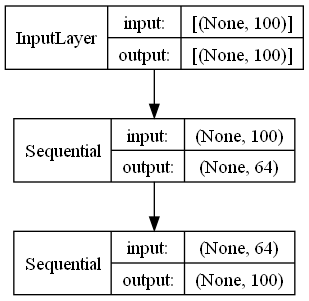

In [12]:
from keras.utils import plot_model

# Visualize the autoencoder model
plot_model(autoencoder_healthy2_vert_y_axis, to_file='autoencoder_healthy2_vert_y_axis_model.png', show_shapes=True, show_layer_names=False)

In [18]:
data_healthy2_6axis_normalized_combined_y_axis = data_healthy2_6axis_normalized_combined[1]
print("Healthy2 all normalized combined size: ", data_healthy2_6axis_normalized_combined_y_axis.shape)
print(data_healthy2_6axis_normalized_combined.shape)
print(data_healthy2_vert_normalised.shape)
print(data_healthy2_vert_normalised[1].shape)

Healthy2 all normalized combined size:  (600,)
(49000, 600)
(3, 49000, 100)
(49000, 100)


#### Training of TFLite micro autoencoder model using single vertical Y axis


In [19]:
# Function to create autoencoder model using only single axis (Y-axis)
def train_autoencoder_6axis(normalized_combined_dataset):
    # Step 2: Split the data
    X_train, X_test = train_test_split(normalized_combined_dataset, test_size=0.20, random_state=42)

    ## DENSE ONE TO TRY REDUCE MODEL SIZE
    input_size = X_train.shape[1]

    input_layer = Input(shape=(input_size,))
    encoder_layer = Sequential([
        Dense(64, activation='elu'),
        Dropout(0),
        Dense(64, activation='elu'),
        Dropout(0),
        Dense(64, activation='elu'),
    ])

    decoder_layer = Sequential([
        Dense(64, activation='elu'),
        Dropout(0),
        Dense(64, activation='elu'),
        Dropout(0),
        Dense(input_size, activation='sigmoid')
    ])

    encoder_layer = encoder_layer(input_layer)
    decoder_layer = decoder_layer(encoder_layer)

    autoencoder = Model(inputs=input_layer, outputs=decoder_layer)

    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, mode="auto")

    # Step 4: Train the autoencoder
    autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

    # Train the autoencoder with the EarlyStopping callback
    history = autoencoder.fit(
        X_train, X_train,
        epochs=100,
        batch_size=256,
        validation_data=(X_test, X_test),
        callbacks=[early_stopping],
        verbose=1
    )
    
    return autoencoder, history, X_train, X_test

# Train autoencoder using healthy2 data
autoencoder_healthy2_6axis_combined, history_healthy2_6axis_combined, X_train_healthy2_6axis_combined, X_test_healthy2_6axis_combined = train_autoencoder_6axis(data_healthy2_6axis_normalized_combined)

# Train autoencoder using healthy3 data
autoencoder_healthy3_6axis_combined, history_healthy3_6axis_combined, X_train_healthy3_6axis_combined, X_test_healthy3_6axis_combined = train_autoencoder_6axis(data_healthy3_6axis_normalized_combined)

autoencoder_healthy2_6axis_combined.summary()
autoencoder_healthy3_6axis_combined.summary()

Epoch 1/100
154/154 [==============================] - 5s 17ms/step - loss: 0.0306 - val_loss: 0.0244
Epoch 2/100
154/154 [==============================] - 2s 13ms/step - loss: 0.0222 - val_loss: 0.0207
Epoch 3/100
154/154 [==============================] - 2s 14ms/step - loss: 0.0197 - val_loss: 0.0191
Epoch 4/100
154/154 [==============================] - 2s 12ms/step - loss: 0.0184 - val_loss: 0.0179
Epoch 5/100
154/154 [==============================] - 2s 13ms/step - loss: 0.0174 - val_loss: 0.0172
Epoch 6/100
154/154 [==============================] - 2s 13ms/step - loss: 0.0168 - val_loss: 0.0166
Epoch 7/100
154/154 [==============================] - 2s 12ms/step - loss: 0.0163 - val_loss: 0.0162
Epoch 8/100
154/154 [==============================] - 2s 14ms/step - loss: 0.0160 - val_loss: 0.0158
Epoch 9/100
154/154 [==============================] - 2s 13ms/step - loss: 0.0156 - val_loss: 0.0155
Epoch 10/100
154/154 [==============================] - 2s 14ms/step - loss: 0.015

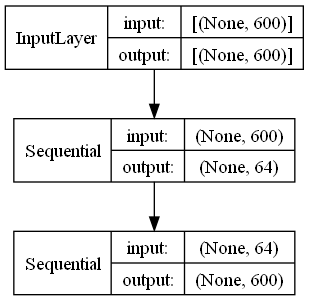

In [20]:
from keras.utils import plot_model

# Visualize the autoencoder model
plot_model(autoencoder_healthy2_6axis_combined, to_file='autoencoder_healthy2_6axis_combined_model.png', show_shapes=True, show_layer_names=False)

#### Transposing data for 3 axis model

In [13]:
# Transpose the data to be in the correct format (Number of samples, Number of features, Number of timesteps)

original_data_healthy_vert_normalised_transposed = np.transpose(original_data_healthy_vert_normalised, (1, 0, 2))
print("original_data_healthy_vert_normalised_transposed shape: ", original_data_healthy_vert_normalised_transposed.shape)

original_data_healthy_hori_normalised_transposed = np.transpose(original_data_healthy_hori_normalised, (1, 0, 2))
print("original_data_healthy_hori_normalised_transposed", original_data_healthy_hori_normalised_transposed.shape)

original_data_unhealthy_vert_normalised_transposed = np.transpose(original_data_unhealthy_vert_normalised, (1, 0, 2))
print("original_data_unhealthy_vert_normalised_transposed", original_data_unhealthy_vert_normalised_transposed.shape)

original_data_unhealthy_hori_normalised_transposed = np.transpose(original_data_unhealthy_hori_normalised, (1, 0, 2))
print("original_data_unhealthy_hori_normalised_transposed", original_data_unhealthy_hori_normalised_transposed.shape)

healthy2_vert_df_normalised_transposed = np.transpose(data_healthy2_vert_normalised, (1, 0, 2))
print("healthy2_vert_df_normalised_transposed", healthy2_vert_df_normalised_transposed.shape)

healthy2_hori_df_normalised_transposed = np.transpose(data_healthy2_hori_normalised, (1, 0, 2))
print("healthy2_hori_df_normalised_transposed", healthy2_hori_df_normalised_transposed.shape)

healthy3_vert_df_normalised_transposed = np.transpose(data_healthy3_vert_normalised, (1, 0, 2))
print("healthy3_vert_df_normalised_transposed", healthy3_vert_df_normalised_transposed.shape)

healthy3_hori_df_normalised_transposed = np.transpose(data_healthy3_hori_normalised, (1, 0, 2))
print("healthy3_hori_df_normalised_transposed", healthy3_hori_df_normalised_transposed.shape)

cavitation2_vert_df_normalised_transposed = np.transpose(data_cavitation2_vert_normalised, (1, 0, 2))
print("caivtation2_vert_df_normalised_transposed", cavitation2_vert_df_normalised_transposed.shape)

caivtation2_hori_df_normalised_transposed = np.transpose(data_cavitation2_hori_normalised, (1, 0, 2))
print("caivtation2_hori_df_normalised_transposed", caivtation2_hori_df_normalised_transposed.shape)



original_data_healthy_vert_normalised_transposed shape:  (49000, 3, 100)
original_data_healthy_hori_normalised_transposed (49000, 3, 100)
original_data_unhealthy_vert_normalised_transposed (49000, 3, 100)
original_data_unhealthy_hori_normalised_transposed (49000, 3, 100)
healthy2_vert_df_normalised_transposed (49000, 3, 100)
healthy2_hori_df_normalised_transposed (49000, 3, 100)
healthy3_vert_df_normalised_transposed (49000, 3, 100)
healthy3_hori_df_normalised_transposed (49000, 3, 100)
caivtation2_vert_df_normalised_transposed (49000, 3, 100)
caivtation2_hori_df_normalised_transposed (49000, 3, 100)


In [ ]:
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Reshape

# Function to create autoencoder model using all 3 axes
def train_autoencoder_3_axis(normalized_dataset):
    # Step 2: Split the data
    X_train, X_test = train_test_split(normalized_dataset, test_size=0.20, random_state=42)

    # Define the input shape
    input_shape = X_train[1].shape

    input_layer = Input(shape=input_shape)
    encoder_layer = Sequential([
        Flatten(input_shape=input_shape),  # Flatten the input
        Dense(64, activation='elu'),
        Dropout(0),
        Dense(64, activation='elu'),
        Dropout(0),
        Dense(64, activation='elu'),
    ])

    decoder_layer = Sequential([
        Dense(64, activation='elu'),
        Dropout(0),
        Dense(64, activation='elu'),
        Dropout(0),
        Dense(np.prod(input_shape), activation='sigmoid'),  # Output layer, with the same shape as input
        Reshape(input_shape),  # Reshape back to the original shape
    ])

    encoder_output = encoder_layer(input_layer)
    decoder_output = decoder_layer(encoder_output)

    autoencoder = Model(inputs=input_layer, outputs=decoder_output)

    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, mode="auto")

    # Step 4: Train the autoencoder
    autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

    # Train the autoencoder with the EarlyStopping callback
    history = autoencoder.fit(
        X_train, X_train,
        epochs=100,
        batch_size=256,
        validation_data=(X_test, X_test),
        callbacks=[early_stopping],
        verbose=1
    )
    
    return autoencoder, history, X_train, X_test

# Train autoencoder using original healthy data
autoencoder_original_healthy_vert_3axis, history_original_3axis, X_train_original_healthy_vert_3axis, X_test_original_healthy_vert_3axis = train_autoencoder_3_axis(original_data_healthy_vert_normalised_transposed)

# Train autoencoder using healthy2 data
autoencoder_healthy2_vert_3axis, history_healthy2_3axis, X_train_healthy2_vert_3axis, X_test_healthy2_vert_3axis = train_autoencoder_3_axis(healthy2_vert_df_normalised_transposed)

# Train autoencoder using healthy3 data
autoencoder_healthy3_vert_3axis, history_healthy3_3axis, X_train_healthy3_vert_3axis, X_test_healthy3_vert_3axis = train_autoencoder_3_axis(healthy3_vert_df_normalised_transposed)


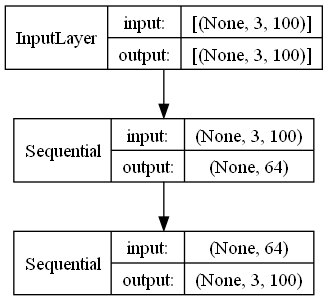

In [16]:
from keras.utils import plot_model

# Visualize the autoencoder model
plot_model(autoencoder_original_healthy_vert_3axis, to_file='autoencoder_original_healthy_vert_3axis_model.png', show_shapes=True, show_layer_names=False)

In [17]:
## ! MODEL SIZE MIGHT BE TOO BIG, TAKING TOO LONG TO TRAIN

# from tensorflow.keras.layers import Flatten
# from tensorflow.keras.layers import Reshape

# # Function to create autoencoder model using all 6 axes (3 vertical and 3 horizontal)
# def train_autoencoder_6_axis(normalized_dataset):
#     # Step 2: Split the data
#     X_train, X_test = train_test_split(normalized_dataset, test_size=0.20, random_state=42)

#     # Define the input shape
#     input_shape = X_train[1].shape

#     input_layer = Input(shape=input_shape)
#     encoder_layer = Sequential([
#         Flatten(input_shape=input_shape),  # Flatten the input
#         Dense(64, activation='elu'),
#         Dropout(0),
#         Dense(64, activation='elu'),
#         Dropout(0),
#         Dense(64, activation='elu'),
#     ])

#     decoder_layer = Sequential([
#         Dense(64, activation='elu'),
#         Dropout(0),
#         Dense(64, activation='elu'),
#         Dropout(0),
#         Dense(np.prod(input_shape), activation='sigmoid'),  # Output layer, with the same shape as input
#         Reshape(input_shape),  # Reshape back to the original shape
#     ])

#     encoder_output = encoder_layer(input_layer)
#     decoder_output = decoder_layer(encoder_output)

#     autoencoder = Model(inputs=input_layer, outputs=decoder_output)

#     early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, mode="auto")

#     # Step 4: Train the autoencoder
#     autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

#     # Train the autoencoder with the EarlyStopping callback
#     history = autoencoder.fit(
#         X_train, X_train,
#         epochs=100,
#         batch_size=256,
#         validation_data=(X_test, X_test),
#         callbacks=[early_stopping],
#         verbose=1
#     )
    
#     return autoencoder, history, X_train, X_test

# # Train autoencoder using original healthy data
# autoencoder_original_healthy_6axis, history_original_6axis, X_train_original_healthy_6axis, X_test_original_healthy_6axis = train_autoencoder_6_axis(original_data_healthy_6axis_normalized)

# # Train autoencoder using healthy2 data
# autoencoder_healthy2_6axis, history_healthy2_6axis, X_train_healthy2_6axis, X_test_healthy2_6axis = train_autoencoder_6_axis(data_healthy2_6axis_normalized)

# # Train autoencoder using healthy3 data
# autoencoder_healthy3_6axis, history_healthy3_6axis, X_train_healthy3_6axis, X_test_healthy3_6axis = train_autoencoder_6_axis(data_healthy3_6axis_normalized)


In [18]:
# from keras.utils import plot_model

# # Visualize the autoencoder model
# plot_model(autoencoder_original_healthy_6axis, to_file='autoencoder_original_healthy_6axis_model.png', show_shapes=True, show_layer_names=False)

#### Evaluating models for y_axis

In [21]:
# Evaluate the models
reconstructed_data_healthy2_y_axis = autoencoder_healthy2_vert_y_axis.predict(X_train_healthy2_vert_y_axis)
reconstructed_data_healthy3_y_axis = autoencoder_healthy3_vert_y_axis.predict(X_train_healthy3_vert_y_axis)

# Calculating the MSE
mse_healthy2_y_axis = np.mean(np.power(X_train_healthy2_vert_y_axis - reconstructed_data_healthy2_y_axis, 2), axis = 1)
mse_healthy3_y_axis = np.mean(np.power(X_train_healthy3_vert_y_axis - reconstructed_data_healthy3_y_axis, 2), axis = 1)

# Set the threshold to the 95th percentile of the reconstruction errors
threshold_healthy2_y_axis = np.percentile(mse_healthy2_y_axis, 95)
threshold_healthy3_y_axis = np.percentile(mse_healthy3_y_axis, 95)

print("Healthy2 y_axis data threshold: ", threshold_healthy2_y_axis)
print("Healthy3 y_axis data threshold: ", threshold_healthy3_y_axis)

1225/1225 [==============================] - 3s 3ms/step
Healthy2 y_axis data threshold:  0.004154864097571462
Healthy3 y_axis data threshold:  0.003972491020681957


#### Evaluating models for 6axis

In [24]:
# Evaluate the models
reconstructed_data_healthy2_6axis_combined = autoencoder_healthy2_6axis_combined.predict(X_train_healthy2_6axis_combined)
reconstructed_data_healthy3_6axis_combined = autoencoder_healthy3_6axis_combined.predict(X_train_healthy3_6axis_combined)
reconstructed_data_loosebase_6axis_combined = autoencoder_healthy3_6axis_combined.predict(data_loosebase_6axis_normalized_combined)
recunstructed_data_cavitation2_6axis_combined = autoencoder_healthy3_6axis_combined.predict(data_cavitation2_6axis_normalized_combined)

# Calculating the MSE
mse_healthy2_6axis_combined = np.mean(np.power(X_train_healthy2_6axis_combined - reconstructed_data_healthy2_6axis_combined, 2), axis = 1)
mse_healthy3_6axis_combined = np.mean(np.power(X_train_healthy3_6axis_combined - reconstructed_data_healthy3_6axis_combined, 2), axis = 1)
mse_loosebase_6axis_combined = np.mean(np.power(data_loosebase_6axis_normalized_combined - reconstructed_data_loosebase_6axis_combined, 2), axis = 1)
mse_cavitation2_6axis_combined = np.mean(np.power(data_cavitation2_6axis_normalized_combined - recunstructed_data_cavitation2_6axis_combined, 2), axis = 1)

# Set the threshold to the 95th percentile of the reconstruction errors
threshold_healthy2_6axis_combined = np.percentile(mse_healthy2_6axis_combined, 95)
threshold_healthy3_6axis_combined = np.percentile(mse_healthy3_6axis_combined, 95)
threshold_loosebase_6axis_combined = np.percentile(mse_loosebase_6axis_combined, 95)
threshold_cavitation2_6axis_combined = np.percentile(mse_cavitation2_6axis_combined, 95)

print("Healthy2 6axis_combined data threshold: ", threshold_healthy2_6axis_combined)
print("Healthy3 6axis_combined data threshold: ", threshold_healthy3_6axis_combined)
print("Loosebase 6axis_combined data threshold: ", threshold_loosebase_6axis_combined)
print("Cavitation2 6axis_combined data threshold: ", threshold_cavitation2_6axis_combined)


1532/1532 [==============================] - 5s 3ms/step
Healthy2 6axis_combined data threshold:  0.01535367353326848
Healthy3 6axis_combined data threshold:  0.014553613906960562
Loosebase 6axis_combined data threshold:  0.04092615994943757
Cavitation2 6axis_combined data threshold:  0.020056815320974163


#### Evaluating models for 3 axis

In [20]:
# Evaluate the 3axis models
reconstructed_data_original_3axis = autoencoder_original_healthy_vert_3axis.predict(X_train_original_healthy_vert_3axis)
reconstructed_data_healthy2_3axis = autoencoder_healthy2_vert_3axis.predict(X_train_healthy2_vert_3axis)
reconstructed_data_healthy3_3axis = autoencoder_healthy3_vert_3axis.predict(X_train_healthy3_vert_3axis)

# Calculating the combined
mse_original_3axis_combined = np.mean(np.power(X_train_original_healthy_vert_3axis - reconstructed_data_original_3axis, 2), axis = 1)
mse_healthy2_3axis_combined = np.mean(np.power(X_train_healthy2_vert_3axis - reconstructed_data_healthy2_3axis, 2), axis = 1)
mse_healthy3_3axis_combined = np.mean(np.power(X_train_healthy3_vert_3axis - reconstructed_data_healthy3_3axis, 2), axis = 1)

# Set the threshold to the 95th percentile of the reconstruction errors
threshold_original_3axis_combined = np.percentile(mse_original_3axis_combined, 95)
threshold_healthy2_3axis_combined = np.percentile(mse_healthy2_3axis_combined, 95)
threshold_healthy3_3axis_combined = np.percentile(mse_healthy3_3axis_combined, 95)

print("Original 3axis healthy data combined threshold: ", threshold_original_3axis_combined)
print("Healthy2 3axis data combined threshold: ", threshold_healthy2_3axis_combined)
print("Healthy3 3axis data combined threshold: ", threshold_healthy3_3axis_combined)
print("-------------------------------------------------------")

# Calcualting MSE for each axis separately
mse_original_3axis_x = np.mean(np.power(X_train_original_healthy_vert_3axis[:,0,:] - reconstructed_data_original_3axis[:,0,:], 2), axis = 1)
mse_original_3axis_y = np.mean(np.power(X_train_original_healthy_vert_3axis[:,1,:] - reconstructed_data_original_3axis[:,1,:], 2), axis = 1)
mse_original_3axis_z = np.mean(np.power(X_train_original_healthy_vert_3axis[:,2,:] - reconstructed_data_original_3axis[:,2,:], 2), axis = 1)

mse_healthy2_3axis_x = np.mean(np.power(X_train_healthy2_vert_3axis[:,0,:] - reconstructed_data_healthy2_3axis[:,0,:], 2), axis = 1)
mse_healthy2_3axis_y = np.mean(np.power(X_train_healthy2_vert_3axis[:,1,:] - reconstructed_data_healthy2_3axis[:,1,:], 2), axis = 1)
mse_healthy2_3axis_z = np.mean(np.power(X_train_healthy2_vert_3axis[:,2,:] - reconstructed_data_healthy2_3axis[:,2,:], 2), axis = 1)

mse_healthy3_3axis_x = np.mean(np.power(X_train_healthy3_vert_3axis[:,0,:] - reconstructed_data_healthy3_3axis[:,0,:], 2), axis = 1)
mse_healthy3_3axis_y = np.mean(np.power(X_train_healthy3_vert_3axis[:,1,:] - reconstructed_data_healthy3_3axis[:,1,:], 2), axis = 1)
mse_healthy3_3axis_z = np.mean(np.power(X_train_healthy3_vert_3axis[:,2,:] - reconstructed_data_healthy3_3axis[:,2,:], 2), axis = 1)

# Set the threshold to the 95th percentile of the reconstruction errors
threshold_original_3axis_x = np.percentile(mse_original_3axis_x, 95)
threshold_original_3axis_y = np.percentile(mse_original_3axis_y, 95)
threshold_original_3axis_z = np.percentile(mse_original_3axis_z, 95)

print("Original 3axis healthy data x-axis threshold: ", threshold_original_3axis_x)
print("Original 3axis healthy data y-axis threshold: ", threshold_original_3axis_y)
print("Original 3axis healthy data z-axis threshold: ", threshold_original_3axis_z)
print("-------------------------------------------------------")

threshold_healthy2_3axis_x = np.percentile(mse_healthy2_3axis_x, 95)
threshold_healthy2_3axis_y = np.percentile(mse_healthy2_3axis_y, 95)
threshold_healthy2_3axis_z = np.percentile(mse_healthy2_3axis_z, 95)

print("Healthy2 3axis data x-axis threshold: ", threshold_healthy2_3axis_x)
print("Healthy2 3axis data y-axis threshold: ", threshold_healthy2_3axis_y)
print("Healthy2 3axis data z-axis threshold: ", threshold_healthy2_3axis_z)
print("-------------------------------------------------------")

threshold_healthy3_3axis_x = np.percentile(mse_healthy3_3axis_x, 95)
threshold_healthy3_3axis_y = np.percentile(mse_healthy3_3axis_y, 95)
threshold_healthy3_3axis_z = np.percentile(mse_healthy3_3axis_z, 95)

print("Healthy3 3axis data x-axis threshold: ", threshold_healthy3_3axis_x)
print("Healthy3 3axis data y-axis threshold: ", threshold_healthy3_3axis_y)
print("Healthy3 3axis data z-axis threshold: ", threshold_healthy3_3axis_z)
print("-------------------------------------------------------")



1225/1225 [==============================] - 2s 2ms/step
Original 3axis healthy data combined threshold:  0.029688993676929877
Healthy2 3axis data combined threshold:  0.024484969687437744
Healthy3 3axis data combined threshold:  0.023348113183261524
-------------------------------------------------------
Original 3axis healthy data x-axis threshold:  0.015678741730111974
Original 3axis healthy data y-axis threshold:  0.01457493757189018
Original 3axis healthy data z-axis threshold:  0.020714014036615432
-------------------------------------------------------
Healthy2 3axis data x-axis threshold:  0.01077592215445059
Healthy2 3axis data y-axis threshold:  0.011659902493324836
Healthy2 3axis data z-axis threshold:  0.01672047504728165
-------------------------------------------------------
Healthy3 3axis data x-axis threshold:  0.011864077692784938
Healthy3 3axis data y-axis threshold:  0.009392520397345326
Healthy3 3axis data z-axis threshold:  0.016335650485168007
--------------------

#### Plotting of results for y axis data

Plotting the results for healthy2 data against healthy3 data
307/307 [==============================] - 1s 2ms/step
Number of anomalies in baseline data: 500 out of 9800 samples
Anomalies in baseline data: 5.1020408163265305 %
307/307 [==============================] - 0s 1ms/step
Number of anomalies in test data: 315 out of 9800 samples
Anomalies in test data: 3.214285714285714 %
-------------------------------------------------------
Plotting the results for healthy3 data against healthy2 data


C:\Users\jared\AppData\Local\Temp\ipykernel_15092\4262851883.py:55: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


307/307 [==============================] - 1s 3ms/step
Number of anomalies in baseline data: 507 out of 9800 samples
Anomalies in baseline data: 5.173469387755103 %
307/307 [==============================] - 1s 3ms/step
Number of anomalies in test data: 1484 out of 9800 samples
Anomalies in test data: 15.142857142857144 %
-------------------------------------------------------


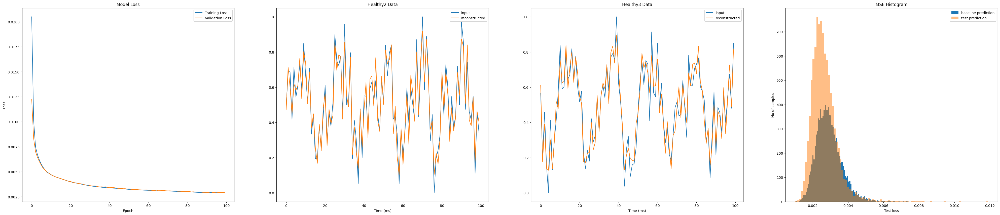

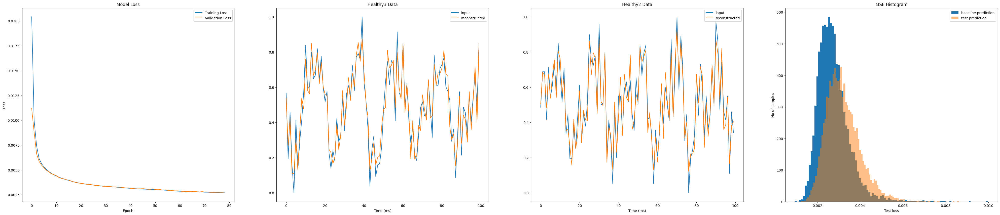

In [23]:
# Function for anomaly detection
def is_anomaly_y_axis(data, model, threshold, title, ax, axpos):
    reconstructed_data = model.predict(data)
    
    ax[axpos].set_title(title)
    ax[axpos].plot(data[0, :], label='input')
    ax[axpos].plot(reconstructed_data[0, :], label='reconstructed')
    ax[axpos].set_xlabel("Time (ms)")
    ax[axpos].legend(loc='upper right')
    
    mse = np.mean(np.power(data - reconstructed_data, 2), axis = 1)
    return mse > threshold, mse

# Function for plotting the loss, anomalies, and MSE histogram
def plot_results_y_axis(history, autoencoder, threshold, baseline_data, test_data, train_title, test_title):
    fig, ax = plt.subplots(1, 4, figsize=(50, 10))
    
    # Plot training & validation loss values
    ax[0].plot(history.history['loss'], label='Training Loss')
    ax[0].plot(history.history['val_loss'], label='Validation Loss')
    ax[0].set_title('Model Loss')
    ax[0].set_ylabel('Loss')
    ax[0].set_xlabel('Epoch')
    ax[0].legend(loc='upper right')

    # Test with a new data point
    count_baseline = 0
    anomalies_baseline, mse_baseline = is_anomaly_y_axis(baseline_data, autoencoder, threshold, train_title, ax, 1)

    for i in anomalies_baseline:
        if i == True:
            count_baseline += 1

    print("Number of anomalies in baseline data:", count_baseline, "out of", anomalies_baseline.size, "samples")
    print("Anomalies in baseline data:", (count_baseline / anomalies_baseline.size) * 100, "%")

    # Test unhealthy data
    anomalies_test, mse_test = is_anomaly_y_axis(test_data, autoencoder, threshold, test_title, ax, 2)

    count_test = 0
    for i in anomalies_test:
        if i == True:
            count_test += 1

    print("Number of anomalies in test data:", count_test, "out of", anomalies_test.size, "samples")
    print("Anomalies in test data:", (count_test / anomalies_test.size) * 100, "%")

    # plot mse histogram
    ax[3].set_title("MSE Histogram")
    ax[3].hist(mse_baseline, bins=100, label='baseline prediction')
    ax[3].hist(mse_test, bins=100, label='test prediction', alpha=0.5)
    ax[3].set_xlabel("Test loss")
    ax[3].set_ylabel("No of samples")
    ax[3].legend(loc='upper right')
    fig.show()


# Plotting the results for healthy2 data against healthy3 data
print("Plotting the results for healthy2 data against healthy3 data")
plot_results_y_axis(history_healthy2_y_axis, autoencoder_healthy2_vert_y_axis, threshold_healthy2_y_axis, X_test_healthy2_vert_y_axis, X_test_healthy3_vert_y_axis, "Healthy2 Data", "Healthy3 Data")
print("-------------------------------------------------------")


# Plotting the results for healthy3 data against healthy2 data
print("Plotting the results for healthy3 data against healthy2 data")
plot_results_y_axis(history_healthy3_y_axis, autoencoder_healthy3_vert_y_axis, threshold_healthy3_y_axis, X_test_healthy3_vert_y_axis, X_test_healthy2_vert_y_axis, "Healthy3 Data", "Healthy2 Data")
print("-------------------------------------------------------")


#### Plotting of results for 6 axis data

Testing healthy3 data using healthy2 data as baseline
307/307 [==============================] - 2s 5ms/step
Number of anomalies in baseline data: 537 out of 9800 samples
Anomalies in baseline data: 5.479591836734694 %
307/307 [==============================] - 2s 5ms/step
Number of anomalies in test data: 800 out of 9800 samples
Anomalies in test data: 8.16326530612245 %


C:\Users\jared\AppData\Local\Temp\ipykernel_15092\90044458.py:55: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


-------------------------------------------------------
Testing loosebase data using healthy2 data as baseline
307/307 [==============================] - 1s 4ms/step
Number of anomalies in baseline data: 537 out of 9800 samples
Anomalies in baseline data: 5.479591836734694 %
1532/1532 [==============================] - 6s 4ms/step
Number of anomalies in test data: 49000 out of 49000 samples
Anomalies in test data: 100.0 %
-------------------------------------------------------
Testing cavitation2 data using healthy2 data as baseline
307/307 [==============================] - 1s 4ms/step
Number of anomalies in baseline data: 537 out of 9800 samples
Anomalies in baseline data: 5.479591836734694 %
1532/1532 [==============================] - 5s 3ms/step
Number of anomalies in test data: 28013 out of 49000 samples
Anomalies in test data: 57.16938775510204 %
-------------------------------------------------------
Testing healthy2 data using healthy3 data as baseline
307/307 [===============

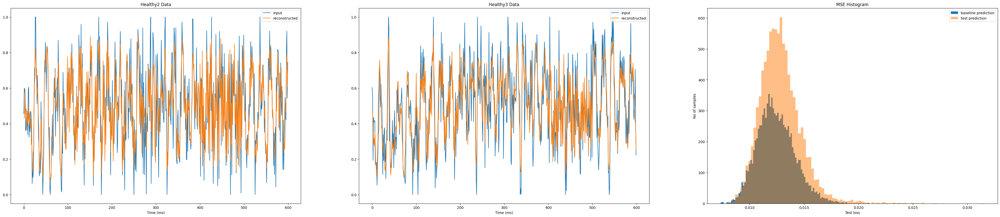

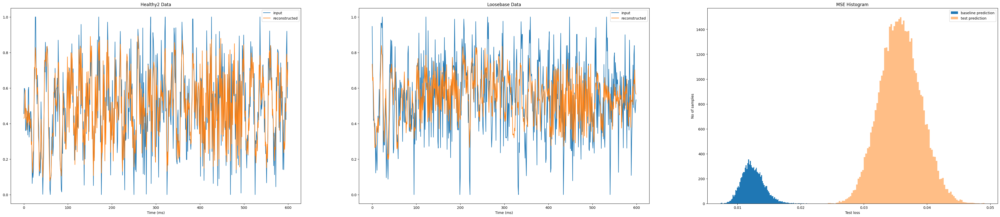

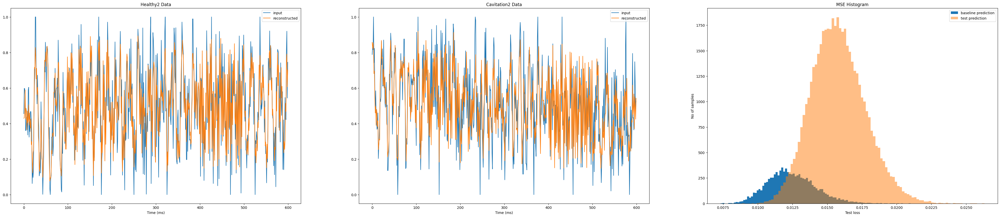

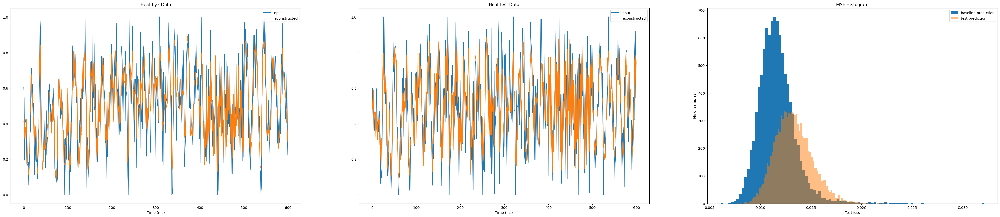

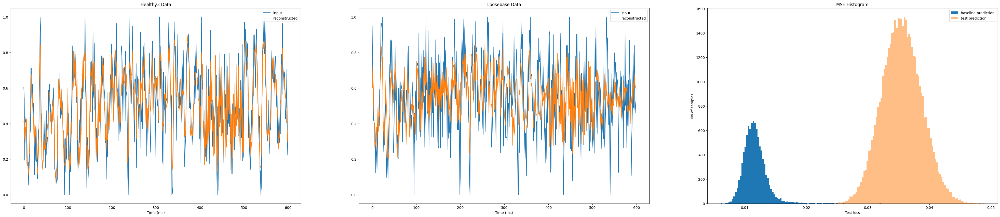

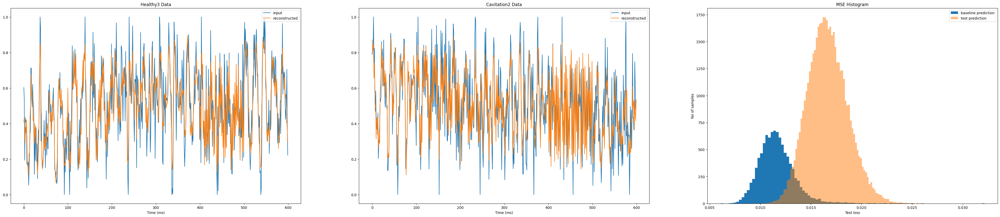

In [27]:
# Function for anomaly detection
def is_anomaly_6axis(data, model, threshold, title, ax, axpos):
    reconstructed_data = model.predict(data)
    
    ax[axpos].set_title(title)
    ax[axpos].plot(data[0, :], label='input')
    ax[axpos].plot(reconstructed_data[0, :], label='reconstructed')
    ax[axpos].set_xlabel("Time (ms)")
    ax[axpos].legend(loc='upper right')
    
    mse = np.mean(np.power(data - reconstructed_data, 2), axis = 1)
    return mse > threshold, mse

# Function for plotting the loss, anomalies, and MSE histogram
def plot_results_6axis(history, autoencoder, threshold, baseline_data, test_data, train_title, test_title):
    fig, ax = plt.subplots(1, 3, figsize=(50, 10))
    
    # # Plot training & validation loss values
    # ax[0].plot(history.history['loss'], label='Training Loss')
    # ax[0].plot(history.history['val_loss'], label='Validation Loss')
    # ax[0].set_title('Model Loss')
    # ax[0].set_ylabel('Loss')
    # ax[0].set_xlabel('Epoch')
    # ax[0].legend(loc='upper right')

    # Test with a new data point
    count_baseline = 0
    anomalies_baseline, mse_baseline = is_anomaly_6axis(baseline_data, autoencoder, threshold, train_title, ax, 0)

    for i in anomalies_baseline:
        if i == True:
            count_baseline += 1

    print("Number of anomalies in baseline data:", count_baseline, "out of", anomalies_baseline.size, "samples")
    print("Anomalies in baseline data:", (count_baseline / anomalies_baseline.size) * 100, "%")

    # Test unhealthy data
    anomalies_test, mse_test = is_anomaly_6axis(test_data, autoencoder, threshold, test_title, ax, 1)

    count_test = 0
    for i in anomalies_test:
        if i == True:
            count_test += 1

    print("Number of anomalies in test data:", count_test, "out of", anomalies_test.size, "samples")
    print("Anomalies in test data:", (count_test / anomalies_test.size) * 100, "%")

    # plot mse histogram
    ax[2].set_title("MSE Histogram")
    ax[2].hist(mse_baseline, bins=100, label='baseline prediction')
    ax[2].hist(mse_test, bins=100, label='test prediction', alpha=0.5)
    ax[2].set_xlabel("Test loss")
    ax[2].set_ylabel("No of samples")
    ax[2].legend(loc='upper right')
    fig.show()


# Testing healthy3 data using healthy2 data as baseline
print("Testing healthy3 data using healthy2 data as baseline")
plot_results_6axis(history_healthy2_6axis_combined, autoencoder_healthy2_6axis_combined, threshold_healthy2_6axis_combined, X_test_healthy2_6axis_combined, X_test_healthy3_6axis_combined, "Healthy2 Data", "Healthy3 Data")
print("-------------------------------------------------------")

# Testing loosebase data using healthy2 data as baseline
print("Testing loosebase data using healthy2 data as baseline")
plot_results_6axis(history_healthy2_6axis_combined, autoencoder_healthy2_6axis_combined, threshold_healthy2_6axis_combined, X_test_healthy2_6axis_combined, data_loosebase_6axis_normalized_combined, "Healthy2 Data", "Loosebase Data")
print("-------------------------------------------------------")

# Testing cavitation2 data using healthy2 data as baseline
print("Testing cavitation2 data using healthy2 data as baseline")
plot_results_6axis(history_healthy2_6axis_combined, autoencoder_healthy2_6axis_combined, threshold_healthy2_6axis_combined, X_test_healthy2_6axis_combined, data_cavitation2_6axis_normalized_combined, "Healthy2 Data", "Cavitation2 Data")
print("-------------------------------------------------------")

# Testing healthy2 data using healthy3 data as baseline
print("Testing healthy2 data using healthy3 data as baseline")
plot_results_6axis(history_healthy3_6axis_combined, autoencoder_healthy3_6axis_combined, threshold_healthy3_6axis_combined, X_test_healthy3_6axis_combined, X_test_healthy2_6axis_combined, "Healthy3 Data", "Healthy2 Data")
print("-------------------------------------------------------")

# Testing loosebase data using healthy3 data as baseline
print("Testing loosebase data using healthy3 data as baseline")
plot_results_6axis(history_healthy3_6axis_combined, autoencoder_healthy3_6axis_combined, threshold_healthy3_6axis_combined, X_test_healthy3_6axis_combined, data_loosebase_6axis_normalized_combined, "Healthy3 Data", "Loosebase Data")
print("-------------------------------------------------------")

# Testing cavitation2 data using healthy3 data as baseline
print("Testing cavitation2 data using healthy3 data as baseline")
plot_results_6axis(history_healthy3_6axis_combined, autoencoder_healthy3_6axis_combined, threshold_healthy3_6axis_combined, X_test_healthy3_6axis_combined, data_cavitation2_6axis_normalized_combined, "Healthy3 Data", "Cavitation2 Data")
print("-------------------------------------------------------")


#### Plotting the results for the 3 axis models

Plotting the results for original healthy data against healthy2 data
307/307 [==============================] - 1s 2ms/step
Number of anomalies in baseline_x data: 507 out of 9800 samples
Anomalies in baseline_x data: 5.173469387755103 %
Number of anomalies in baseline_y data: 513 out of 9800 samples
Anomalies in baseline_y data: 5.23469387755102 %
Number of anomalies in baseline_z data: 546 out of 9800 samples
Anomalies in baseline_z data: 5.571428571428571 %
307/307 [==============================] - 1s 2ms/step
Number of anomalies in test_x data: 79 out of 9800 samples
Anomalies in test_x data: 0.8061224489795917 %
Number of anomalies in test_y data: 2765 out of 9800 samples
Anomalies in test_y data: 28.214285714285715 %
Number of anomalies in test_z data: 375 out of 9800 samples
Anomalies in test data_z: 3.826530612244898 %


C:\Users\jared\AppData\Local\Temp\ipykernel_24908\914627683.py:109: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig_x.show()
C:\Users\jared\AppData\Local\Temp\ipykernel_24908\914627683.py:117: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig_y.show()
C:\Users\jared\AppData\Local\Temp\ipykernel_24908\914627683.py:125: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig_z.show()


-------------------------------------------------------
Plotting the results for original healthy data against healthy3 data
307/307 [==============================] - 1s 2ms/step
Number of anomalies in baseline_x data: 507 out of 9800 samples
Anomalies in baseline_x data: 5.173469387755103 %
Number of anomalies in baseline_y data: 513 out of 9800 samples
Anomalies in baseline_y data: 5.23469387755102 %
Number of anomalies in baseline_z data: 546 out of 9800 samples
Anomalies in baseline_z data: 5.571428571428571 %
307/307 [==============================] - 1s 3ms/step
Number of anomalies in test_x data: 317 out of 9800 samples
Anomalies in test_x data: 3.2346938775510203 %
Number of anomalies in test_y data: 184 out of 9800 samples
Anomalies in test_y data: 1.8775510204081631 %
Number of anomalies in test_z data: 598 out of 9800 samples
Anomalies in test data_z: 6.1020408163265305 %
-------------------------------------------------------
Plotting the results for healthy2 data against 

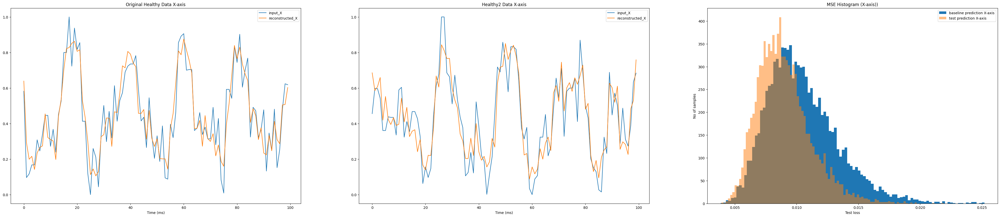

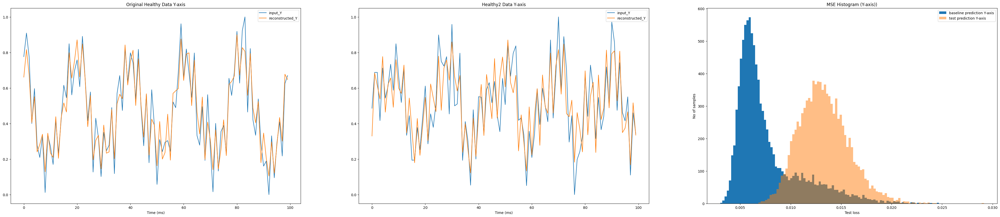

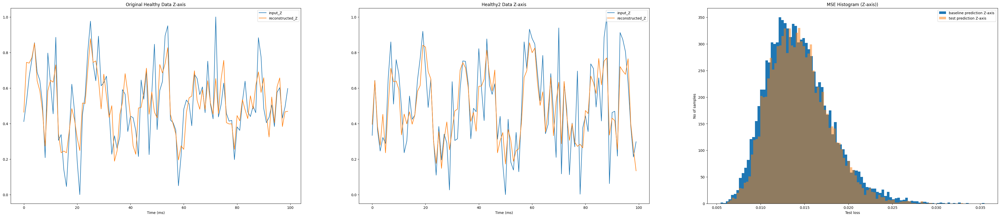

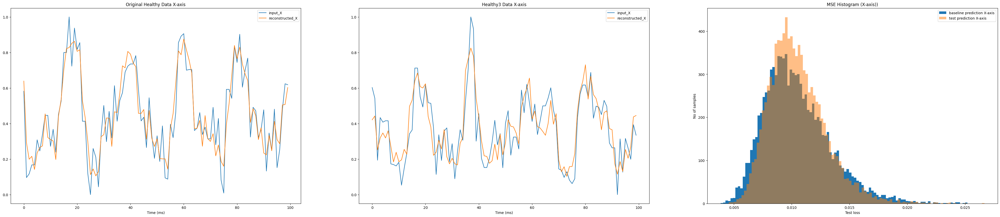

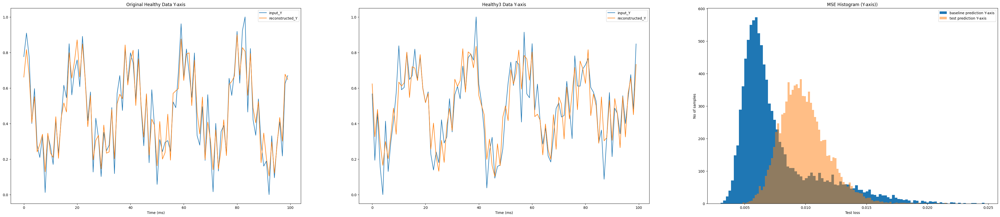

...

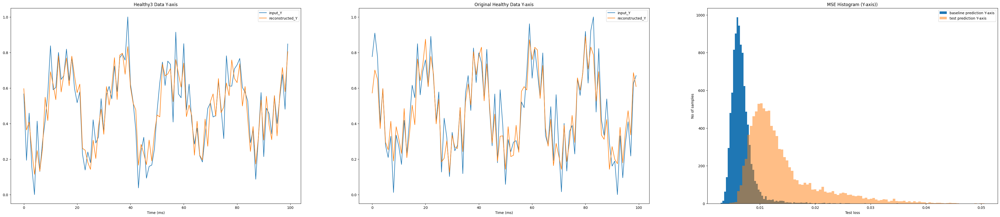

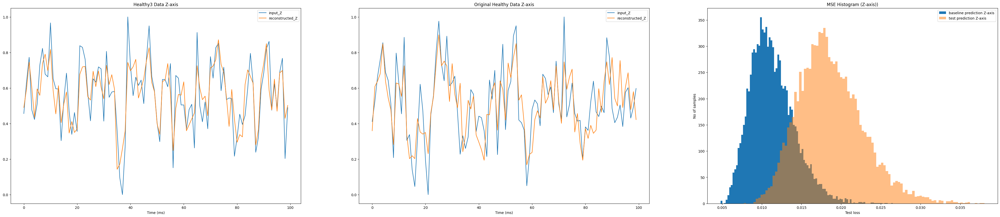

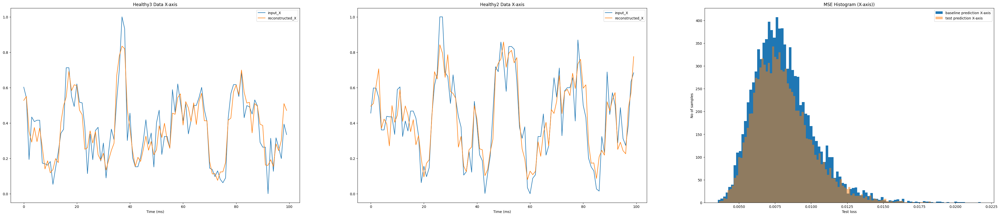

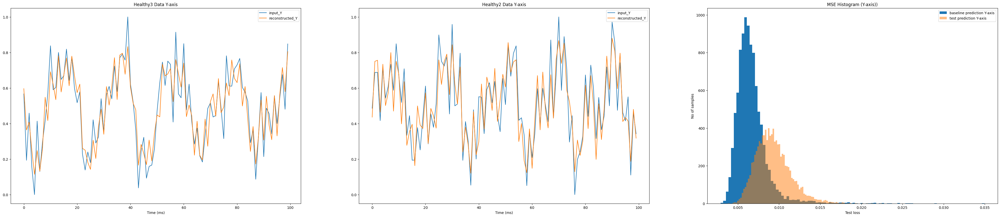

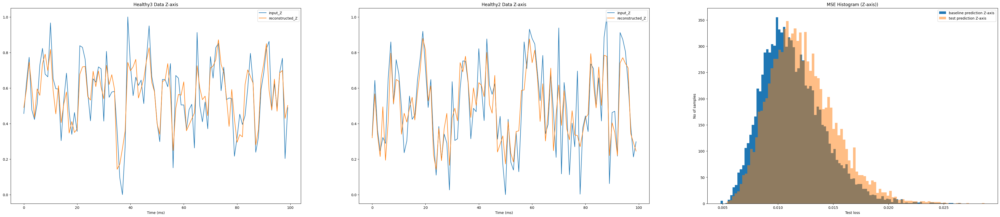

In [22]:
# Function for anomaly detection
def is_anomaly_3axis(data, model, threshold_x, threshold_y, threshold_z, title, ax_x, ax_y, ax_z, axpos):
    reconstructed_data = model.predict(data)

    # Split data and reconstructed data into 3 axes for plotting
    data_x = data[:, 0, :]
    data_y = data[:, 1, :]
    data_z = data[:, 2, :]
    reconstructed_data_x = reconstructed_data[:, 0, :]
    reconstructed_data_y = reconstructed_data[:, 1, :]
    reconstructed_data_z = reconstructed_data[:, 2, :]
    
    ax_x[axpos].set_title(title + " X-axis")
    ax_x[axpos].plot(data_x[0,:], label='input_X')
    ax_x[axpos].plot(reconstructed_data_x[0,:], label='reconstructed_X')
    ax_x[axpos].set_xlabel("Time (ms)")
    ax_x[axpos].legend(loc='upper right')

    ax_y[axpos].set_title(title + " Y-axis")
    ax_y[axpos].plot(data_y[0,:], label='input_Y')
    ax_y[axpos].plot(reconstructed_data_y[0,:], label='reconstructed_Y')
    ax_y[axpos].set_xlabel("Time (ms)")
    ax_y[axpos].legend(loc='upper right')

    ax_z[axpos].set_title(title + " Z-axis")
    ax_z[axpos].plot(data_z[0,:], label='input_Z')
    ax_z[axpos].plot(reconstructed_data_z[0,:], label='reconstructed_Z')
    ax_z[axpos].set_xlabel("Time (ms)")
    ax_z[axpos].legend(loc='upper right')
    
    mse_x = np.mean(np.power(data_x - reconstructed_data_x, 2), axis = 1)
    mse_y = np.mean(np.power(data_y - reconstructed_data_y, 2), axis = 1)
    mse_z = np.mean(np.power(data_z - reconstructed_data_z, 2), axis = 1)

    return mse_x > threshold_x, mse_x, mse_y > threshold_y, mse_y, mse_z > threshold_z, mse_z

# Function for plotting the loss, anomalies, and MSE histogram
def plot_results_3axis(history, autoencoder, threshold_x, threshold_y, threshold_z, baseline_data, test_data, train_title, test_title):
    fig_x, ax_x = plt.subplots(1, 3, figsize=(50, 10))
    fig_y, ax_y = plt.subplots(1, 3, figsize=(50, 10))
    fig_z, ax_z = plt.subplots(1, 3, figsize=(50, 10))
    
    # # Plot training & validation loss values
    # ax[0].plot(history.history['loss'], label='Training Loss')
    # ax[0].plot(history.history['val_loss'], label='Validation Loss')
    # ax[0].set_title('Model Loss')
    # ax[0].set_ylabel('Loss')
    # ax[0].set_xlabel('Epoch')
    # ax[0].legend(loc='upper right')

    
    anomalies_baseline_x, mse_baseline_x, anomalies_baseline_y, mse_baseline_y, anomalies_baseline_z, mse_baseline_z = is_anomaly_3axis(baseline_data, autoencoder, threshold_x, threshold_y, threshold_z, train_title, ax_x, ax_y, ax_z, 0)
    
    # Calcualting MSE for each axis separately
    count_baseline_x = 0
    for i in anomalies_baseline_x:
        if i == True:
            count_baseline_x += 1
    print("Number of anomalies in baseline_x data:", count_baseline_x, "out of", anomalies_baseline_x.size, "samples")
    print("Anomalies in baseline_x data:", (count_baseline_x / anomalies_baseline_x.size) * 100, "%")

    count_baseline_y = 0
    for i in anomalies_baseline_y:
        if i == True:
            count_baseline_y += 1
    print("Number of anomalies in baseline_y data:", count_baseline_y, "out of", anomalies_baseline_y.size, "samples")
    print("Anomalies in baseline_y data:", (count_baseline_y / anomalies_baseline_y.size) * 100, "%")

    count_baseline_z = 0
    for i in anomalies_baseline_z:
        if i == True:
            count_baseline_z += 1
    print("Number of anomalies in baseline_z data:", count_baseline_z, "out of", anomalies_baseline_z.size, "samples")
    print("Anomalies in baseline_z data:", (count_baseline_z / anomalies_baseline_z.size) * 100, "%")

    # Test data
    anomalies_test_x, mse_test_x, anomalies_test_y, mse_test_y, anomalies_test_z, mse_test_z = is_anomaly_3axis(test_data, autoencoder, threshold_x, threshold_y, threshold_z, test_title, ax_x, ax_y, ax_z, 1)

    # Calcualting MSE for each axis separately
    count_test_x = 0
    for i in anomalies_test_x:
        if i == True:
            count_test_x += 1
    print("Number of anomalies in test_x data:", count_test_x, "out of", anomalies_test_x.size, "samples")
    print("Anomalies in test_x data:", (count_test_x / anomalies_test_x.size) * 100, "%")

    count_test_y = 0
    for i in anomalies_test_y:
        if i == True:
            count_test_y += 1
    print("Number of anomalies in test_y data:", count_test_y, "out of", anomalies_test_y.size, "samples")
    print("Anomalies in test_y data:", (count_test_y / anomalies_test_y.size) * 100, "%")

    count_test_z = 0
    for i in anomalies_test_z:
        if i == True:
            count_test_z += 1
    print("Number of anomalies in test_z data:", count_test_z, "out of", anomalies_test_z.size, "samples")
    print("Anomalies in test data_z:", (count_test_z / anomalies_test_z.size) * 100, "%")


    # plot mse histogram
    ax_x[2].set_title("MSE Histogram (X-axis))")
    ax_x[2].hist(mse_baseline_x, bins=100, label='baseline prediction X-axis')
    ax_x[2].hist(mse_test_x, bins=100, label='test prediction X-axis', alpha=0.5)
    ax_x[2].set_xlabel("Test loss")
    ax_x[2].set_ylabel("No of samples")
    ax_x[2].legend(loc='upper right')
    fig_x.show()

    ax_y[2].set_title("MSE Histogram (Y-axis))")
    ax_y[2].hist(mse_baseline_y, bins=100, label='baseline prediction Y-axis')
    ax_y[2].hist(mse_test_y, bins=100, label='test prediction Y-axis', alpha=0.5)
    ax_y[2].set_xlabel("Test loss")
    ax_y[2].set_ylabel("No of samples")
    ax_y[2].legend(loc='upper right')
    fig_y.show()

    ax_z[2].set_title("MSE Histogram (Z-axis))")
    ax_z[2].hist(mse_baseline_z, bins=100, label='baseline prediction Z-axis')
    ax_z[2].hist(mse_test_z, bins=100, label='test prediction Z-axis', alpha=0.5)
    ax_z[2].set_xlabel("Test loss")
    ax_z[2].set_ylabel("No of samples")
    ax_z[2].legend(loc='upper right')
    fig_z.show()

# Plotting the results for original healthy data against healthy2 data
print("Plotting the results for original healthy data against healthy2 data")
plot_results_3axis(history_original_3axis, autoencoder_original_healthy_vert_3axis, threshold_original_3axis_x, threshold_original_3axis_y, threshold_original_3axis_z, X_test_original_healthy_vert_3axis, X_test_healthy2_vert_3axis, "Original Healthy Data", "Healthy2 Data")
print("-------------------------------------------------------")

# Plotting the results for original healthy data against healthy3 data
print("Plotting the results for original healthy data against healthy3 data")
plot_results_3axis(history_original_3axis, autoencoder_original_healthy_vert_3axis, threshold_original_3axis_x, threshold_original_3axis_y, threshold_original_3axis_z, X_test_original_healthy_vert_3axis, X_test_healthy3_vert_3axis, "Original Healthy Data", "Healthy3 Data")
print("-------------------------------------------------------")

# Plotting the results for healthy2 data against original healthy data
print("Plotting the results for healthy2 data against original healthy data")
plot_results_3axis(history_healthy2_3axis, autoencoder_healthy2_vert_3axis, threshold_healthy2_3axis_x, threshold_healthy2_3axis_y, threshold_healthy2_3axis_z, X_test_healthy2_vert_3axis, X_test_original_healthy_vert_3axis, "Healthy2 Data", "Original Healthy Data")
print("-------------------------------------------------------")

# Plotting the results for healthy2 data against healthy3 data
print("Plotting the results for healthy2 data against healthy3 data")
plot_results_3axis(history_healthy2_3axis, autoencoder_healthy2_vert_3axis, threshold_healthy2_3axis_x, threshold_healthy2_3axis_y, threshold_healthy2_3axis_z, X_test_healthy2_vert_3axis, X_test_healthy3_vert_3axis, "Healthy2 Data", "Healthy3 Data")
print("-------------------------------------------------------")

# Plotting the results for healthy3 data against original healthy data
print("Plotting the results for healthy3 data against original healthy data")
plot_results_3axis(history_healthy3_3axis, autoencoder_healthy3_vert_3axis, threshold_healthy3_3axis_x, threshold_healthy3_3axis_y, threshold_healthy3_3axis_z, X_test_healthy3_vert_3axis, X_test_original_healthy_vert_3axis, "Healthy3 Data", "Original Healthy Data")
print("-------------------------------------------------------")

# Plotting the results for healthy3 data against healthy2 data
print("Plotting the results for healthy3 data against healthy2 data")
plot_results_3axis(history_healthy3_3axis, autoencoder_healthy3_vert_3axis, threshold_healthy3_3axis_x, threshold_healthy3_3axis_y, threshold_healthy3_3axis_z, X_test_healthy3_vert_3axis, X_test_healthy2_vert_3axis, "Healthy3 Data", "Healthy2 Data")
print("-------------------------------------------------------")


### Conversion to TFLite model


In [29]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
from tinymlgen import port

from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dropout
from tensorflow.keras.models import Sequential

# def representative_dataset():
#     for val in X_test:
#         # val = np.expand_dims(val, axis=0)
#         yield [np.array(val, dtype=np.float32)]

def healthy2_representative_dataset_y_axis():
    for data in tf.data.Dataset.from_tensor_slices(X_test_healthy2_vert_y_axis).batch(1).take(1000):
        yield [tf.dtypes.cast(data, tf.float32)]

def healthy3_representative_dataset_y_axis():
    for data in tf.data.Dataset.from_tensor_slices(X_test_healthy3_vert_y_axis).batch(1).take(1000):
        yield [tf.dtypes.cast(data, tf.float32)]

        
def healthy2_representative_dataset_3axis():
    for data in tf.data.Dataset.from_tensor_slices(X_test_healthy2_vert_3axis).batch(1).take(1000):
        yield [tf.dtypes.cast(data, tf.float32)]
        
def healthy3_representative_dataset_3axis():
    for data in tf.data.Dataset.from_tensor_slices(X_test_healthy3_vert_3axis).batch(1).take(1000):
        yield [tf.dtypes.cast(data, tf.float32)]
        
def healthy2_representative_dataset_6axis():
    for data in tf.data.Dataset.from_tensor_slices(X_test_healthy2_6axis_combined).batch(1).take(1000):
        yield [tf.dtypes.cast(data, tf.float32)]
        
def healthy3_representative_dataset_6axis():
    for data in tf.data.Dataset.from_tensor_slices(X_test_healthy3_6axis_combined).batch(1).take(1000):
        yield [tf.dtypes.cast(data, tf.float32)]
        

# Full integer quantization for healthy2 data (Y-axis)
fullint_converter_healthy2 = tf.lite.TFLiteConverter.from_keras_model(autoencoder_healthy2_vert_y_axis)
fullint_converter_healthy2.optimizations = [tf.lite.Optimize.DEFAULT]
fullint_converter_healthy2.representative_dataset = healthy2_representative_dataset_y_axis
fullint_tflite_model_healthy2 = fullint_converter_healthy2.convert()

# Full integer quantization for healthy3 data (Y-axis)
fullint_converter_healthy3 = tf.lite.TFLiteConverter.from_keras_model(autoencoder_healthy3_vert_y_axis)
fullint_converter_healthy3.optimizations = [tf.lite.Optimize.DEFAULT]
fullint_converter_healthy3.representative_dataset = healthy3_representative_dataset_y_axis
fullint_tflite_model_healthy3 = fullint_converter_healthy3.convert()

# # Full integer quantization for healthy2 data (3axis)
# fullint_converter_healthy2_3axis = tf.lite.TFLiteConverter.from_keras_model(autoencoder_healthy2_vert_3axis)
# fullint_converter_healthy2_3axis.optimizations = [tf.lite.Optimize.DEFAULT]
# fullint_converter_healthy2_3axis.representative_dataset = healthy2_representative_dataset_3axis
# fullint_tflite_model_healthy2_3axis = fullint_converter_healthy2_3axis.convert()

# # Full integer quantization for healthy3 data (3axis)
# fullint_converter_healthy3_3axis = tf.lite.TFLiteConverter.from_keras_model(autoencoder_healthy3_vert_3axis)
# fullint_converter_healthy3_3axis.optimizations = [tf.lite.Optimize.DEFAULT]
# fullint_converter_healthy3_3axis.representative_dataset = healthy3_representative_dataset_3axis
# fullint_tflite_model_healthy3_3axis = fullint_converter_healthy3_3axis.convert()

# Full integer quantization for healthy2 data (6axis)
fullint_converter_healthy2_6axis = tf.lite.TFLiteConverter.from_keras_model(autoencoder_healthy2_6axis_combined)
fullint_converter_healthy2_6axis.optimizations = [tf.lite.Optimize.DEFAULT]
fullint_converter_healthy2_6axis.representative_dataset = healthy2_representative_dataset_6axis
fullint_tflite_model_healthy2_6axis = fullint_converter_healthy2_6axis.convert()

# Full integer quantization for healthy3 data (6axis)
fullint_converter_healthy3_6axis = tf.lite.TFLiteConverter.from_keras_model(autoencoder_healthy3_6axis_combined)
fullint_converter_healthy3_6axis.optimizations = [tf.lite.Optimize.DEFAULT]
fullint_converter_healthy3_6axis.representative_dataset = healthy3_representative_dataset_6axis
fullint_tflite_model_healthy3_6axis = fullint_converter_healthy3_6axis.convert()

# Save the models
open("Healthy2_model_fullint_quantized_y_axis.tflite", "wb").write(fullint_tflite_model_healthy2)
open("Healthy3_model_fullint_quantized_y_axis.tflite", "wb").write(fullint_tflite_model_healthy3)
# open("Healthy2_model_fullint_quantized_3axis.tflite", "wb").write(fullint_tflite_model_healthy2_3axis)
# open("Healthy3_model_fullint_quantized_3axis.tflite", "wb").write(fullint_tflite_model_healthy3_3axis)
open("Healthy2_model_fullint_quantized_6axis.tflite", "wb").write(fullint_tflite_model_healthy2_6axis)
open("Healthy3_model_fullint_quantized_6axis.tflite", "wb").write(fullint_tflite_model_healthy3_6axis)


INFO:tensorflow:Assets written to: C:\Users\jared\AppData\Local\Temp\tmpuytkl4wi\assets


INFO:tensorflow:Assets written to: C:\Users\jared\AppData\Local\Temp\tmpuytkl4wi\assets
c:\Users\jared\AppData\Local\Programs\Python\Python310\lib\site-packages\tensorflow\lite\python\convert.py:887: UserWarning: Statistics for quantized inputs were expected, but not specified; continuing anyway.
  warnings.warn(


INFO:tensorflow:Assets written to: C:\Users\jared\AppData\Local\Temp\tmpp5rrj7uy\assets


INFO:tensorflow:Assets written to: C:\Users\jared\AppData\Local\Temp\tmpp5rrj7uy\assets
c:\Users\jared\AppData\Local\Programs\Python\Python310\lib\site-packages\tensorflow\lite\python\convert.py:887: UserWarning: Statistics for quantized inputs were expected, but not specified; continuing anyway.
  warnings.warn(


INFO:tensorflow:Assets written to: C:\Users\jared\AppData\Local\Temp\tmp6b395j71\assets


INFO:tensorflow:Assets written to: C:\Users\jared\AppData\Local\Temp\tmp6b395j71\assets
c:\Users\jared\AppData\Local\Programs\Python\Python310\lib\site-packages\tensorflow\lite\python\convert.py:887: UserWarning: Statistics for quantized inputs were expected, but not specified; continuing anyway.
  warnings.warn(


INFO:tensorflow:Assets written to: C:\Users\jared\AppData\Local\Temp\tmp7qqgfv3f\assets


INFO:tensorflow:Assets written to: C:\Users\jared\AppData\Local\Temp\tmp7qqgfv3f\assets
c:\Users\jared\AppData\Local\Programs\Python\Python310\lib\site-packages\tensorflow\lite\python\convert.py:887: UserWarning: Statistics for quantized inputs were expected, but not specified; continuing anyway.
  warnings.warn(


103440

#### Copy paste the following lines to run on bash cmdline

xxd -i Original_healthy_model_fullint_quantized.tflite > Original_healthy_model_fullint_quantized.cc  
xxd -i Healthy2_model_fullint_quantized.tflite > Healthy2_model_fullint_quantized.cc  
xxd -i Healthy3_model_fullint_quantized.tflite > Healthy3_model_fullint_quantized.cc


In [24]:
# For evaluating TFLite micro models against the test data
def evaluate_model_y_axis(interpreter, dataset, calculated_threshold):
    # Get input and output tensors.
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()
    num_test_samples = dataset.shape[0]
    # print("Dataset shape: ", dataset.shape)

    # Run predictions on every set in the "test" dataset.
    reconstructed_data = []
    for i in range(num_test_samples):

        # Pre-processing the data to fit it with the model's input.
        input_data = np.array(dataset[i], dtype=np.float32)
        # print("Input data shape:", input_data.shape)
        input_data = np.expand_dims(input_data, axis=0)
        # print("Input data shape after expand_dims:", input_data.shape)
        interpreter.set_tensor(input_details[0]['index'], input_data)

        # Run inference.
        interpreter.invoke()

        # Post-processing: remove batch dimension and find the digit with highest
        # probability.
        output_data = interpreter.get_tensor(output_details[0]['index'])
        reconstructed_data.append(output_data[0])

    # Convert to numpy array from list for easier comparison
    reconstructed_data = np.array(reconstructed_data)

    mse = np.mean(np.power(dataset - reconstructed_data, 2), axis=1)

    anorm_count = 0
    for i in range(num_test_samples):
        if mse[i] > calculated_threshold:
            anorm_count += 1
    
    return np.array(reconstructed_data), mse, anorm_count

#### Evaluating the full int quantized model (Y-axis)

In [25]:
# Testing the TFLite micro models to ensure accruacy not impacted
healthy2_data_y_axis = data_healthy2_vert_normalised[1]
healthy3_data_y_axis = data_healthy3_vert_normalised[1]

# Passing the full integer quantized TF Lite model to the interpreters.
healthy2_interpreter_y_axis = tf.lite.Interpreter('Healthy2_model_fullint_quantized_y_axis.tflite')
healthy3_interpreter_y_axis = tf.lite.Interpreter('Healthy3_model_fullint_quantized_y_axis.tflite')

# Allocating tensors.
healthy2_interpreter_y_axis.allocate_tensors()
healthy3_interpreter_y_axis.allocate_tensors()

# Testing using the healthy2 model as baseline model
print("Testing using the healthy2 model as baseline model")
_, mse_baseline_y_axis, _ = evaluate_model_y_axis(healthy2_interpreter_y_axis, X_test_healthy2_vert_y_axis, threshold_healthy2_y_axis)
# Calculate the threshold for the healthy2 TF Lite model
calculated_threshold_healthy2 = np.percentile(mse_baseline_y_axis, 95)
print("Calculated threshold for healthy2 model: ", calculated_threshold_healthy2)
# Testing using the calculated threshold for the healthy2 TF Lite model
_, _, anorm_count_healthy2_y_axis = evaluate_model_y_axis(healthy2_interpreter_y_axis, healthy2_data_y_axis, calculated_threshold_healthy2)
_, _, anorm_count_healthy3_y_axis = evaluate_model_y_axis(healthy2_interpreter_y_axis, healthy3_data_y_axis, calculated_threshold_healthy2)

print("Number of anomalies in baseline (healthy2) data:", anorm_count_healthy2_y_axis, "out of", healthy2_data_y_axis.shape[0], "samples")
print("Anomalies in baseline (healthy2) data:", (anorm_count_healthy2_y_axis / healthy2_data_y_axis.shape[0]) * 100, "%")

print("Number of anomalies in healthy3 data:", anorm_count_healthy3_y_axis, "out of", healthy3_data_y_axis.shape[0], "samples")
print("Anomalies in healthy3 data:", (anorm_count_healthy3_y_axis / healthy3_data_y_axis.shape[0]) * 100, "%")
print("--------------------------------------------------")

# Testing using the healthy3 model as baseline model
print("Testing using the healthy3 model as baseline model")
_, mse_baseline_y_axis, _ = evaluate_model_y_axis(healthy3_interpreter_y_axis, X_test_healthy3_vert_y_axis, threshold_healthy3_y_axis)
# Calculate the threshold for the healthy3 TF Lite model
calculated_threshold_healthy3 = np.percentile(mse_baseline_y_axis, 95)
print("Calculated threshold for healthy3 model: ", calculated_threshold_healthy3)
# Testing using the calculated threshold for the healthy3 TF Lite model
_, _, anorm_count_healthy2_y_axis = evaluate_model_y_axis(healthy3_interpreter_y_axis, healthy2_data_y_axis, calculated_threshold_healthy3)
_, _, anorm_count_healthy3_y_axis = evaluate_model_y_axis(healthy3_interpreter_y_axis, healthy3_data_y_axis, calculated_threshold_healthy3)

print("Number of anomalies in baseline (healthy3) data:", anorm_count_healthy3_y_axis, "out of", healthy3_data_y_axis.shape[0], "samples")
print("Anomalies in baseline (healthy3) data:", (anorm_count_healthy3_y_axis / healthy3_data_y_axis.shape[0]) * 100, "%")

print("Number of anomalies in healthy2 data:", anorm_count_healthy2_y_axis, "out of", healthy2_data_y_axis.shape[0], "samples")
print("Anomalies in healthy2 data:", (anorm_count_healthy2_y_axis / healthy2_data_y_axis.shape[0]) * 100, "%")
print("--------------------------------------------------")


Testing using the original healthy model as baseline model
Calculated threshold for original healthy model:  0.005065832966614274
Number of anomalies in baseline (original healthy) data: 2305 out of 49000 samples
Anomalies in baseline (original healthy) data: 4.704081632653061 %
Number of anomalies in healthy2 data: 13606 out of 49000 samples
Anomalies in healthy2 data: 27.76734693877551 %
Number of anomalies in healthy3 data: 2703 out of 49000 samples
Anomalies in healthy3 data: 5.516326530612245 %
--------------------------------------------------
Testing using the healthy2 model as baseline model
Calculated threshold for healthy2 model:  0.004369389310724642
Number of anomalies in baseline (healthy2) data: 2384 out of 49000 samples
Anomalies in baseline (healthy2) data: 4.86530612244898 %
Number of anomalies in healthy3 data: 1470 out of 49000 samples
Anomalies in healthy3 data: 3.0 %
Number of anomalies in original healthy data: 18718 out of 49000 samples
Anomalies in original heal

#### Evaluating the full int quantized models (6axis)

In [31]:
# For evaluating TFLite micro models against the test data
def evaluate_model_6axis(interpreter, dataset, calculated_threshold):
    # Get input and output tensors.
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()
    num_test_samples = dataset.shape[0]
    # print("Dataset shape: ", dataset.shape)

    # Run predictions on every set in the "test" dataset.
    reconstructed_data = []
    for i in range(num_test_samples):

        # Pre-processing the data to fit it with the model's input.
        input_data = np.array(dataset[i], dtype=np.float32)
        # print("Input data shape:", input_data.shape)
        input_data = np.expand_dims(input_data, axis=0)
        # print("Input data shape after expand_dims:", input_data.shape)
        interpreter.set_tensor(input_details[0]['index'], input_data)

        # Run inference.
        interpreter.invoke()

        # Post-processing: remove batch dimension and find the digit with highest
        # probability.
        output_data = interpreter.get_tensor(output_details[0]['index'])
        reconstructed_data.append(output_data[0])

    # Convert to numpy array from list for easier comparison
    reconstructed_data = np.array(reconstructed_data)

    mse = np.mean(np.power(dataset - reconstructed_data, 2), axis=1)

    anorm_count = 0
    for i in range(num_test_samples):
        if mse[i] > calculated_threshold:
            anorm_count += 1
    
    return np.array(reconstructed_data), mse, anorm_count

# Passing the full integer quantized TF Lite model to the interpreters.
healthy2_interpreter_6axis = tf.lite.Interpreter('Healthy2_model_fullint_quantized_6axis.tflite')
healthy3_interpreter_6axis = tf.lite.Interpreter('Healthy3_model_fullint_quantized_6axis.tflite')

# Allocating tensors.
healthy2_interpreter_6axis.allocate_tensors()
healthy3_interpreter_6axis.allocate_tensors()

# Testing using the healthy2 model as baseline model
print("Testing using the healthy2 model as baseline model")
_, mse_baseline_6axis, _ = evaluate_model_6axis(healthy2_interpreter_6axis, X_test_healthy2_6axis_combined, threshold_healthy2_6axis_combined)
# Calculate the threshold for the healthy2 TF Lite model
calculated_threshold_healthy2_6axis_combined = np.percentile(mse_baseline_6axis, 95)
print("Calculated threshold for healthy2 6-axis combined model: ", calculated_threshold_healthy2_6axis_combined)
# Testing using the calculated threshold for the healthy2 TF Lite model
_, _, anorm_count_healthy2_6axis = evaluate_model_6axis(healthy2_interpreter_6axis, data_healthy2_6axis_normalized_combined, calculated_threshold_healthy2_6axis_combined)
_, _, anorm_count_healthy3_6axis = evaluate_model_6axis(healthy2_interpreter_6axis, data_healthy3_6axis_normalized_combined, calculated_threshold_healthy2_6axis_combined)
_, _, anorm_count_loosebase_6axis = evaluate_model_6axis(healthy2_interpreter_6axis, data_loosebase_6axis_normalized_combined, calculated_threshold_healthy2_6axis_combined)
_, _, anorm_count_cavitation2_6axis = evaluate_model_6axis(healthy2_interpreter_6axis, data_cavitation2_6axis_normalized_combined, calculated_threshold_healthy2_6axis_combined)

print("Number of anomalies in baseline (healthy2) data:", anorm_count_healthy2_6axis, "out of", data_healthy2_6axis_normalized_combined.shape[0], "samples")
print("Anomalies in baseline (healthy2) data:", (anorm_count_healthy2_6axis / data_healthy2_6axis_normalized_combined.shape[0]) * 100, "%")
print("Number of anomalies in healthy3 data:", anorm_count_healthy3_6axis, "out of", data_healthy3_6axis_normalized_combined.shape[0], "samples")
print("Anomalies in healthy3 data:", (anorm_count_healthy3_6axis / data_healthy3_6axis_normalized_combined.shape[0]) * 100, "%")
print("Number of anomalies in loosebase data:", anorm_count_loosebase_6axis, "out of", data_loosebase_6axis_normalized_combined.shape[0], "samples")
print("Anomalies in loosebase data:", (anorm_count_loosebase_6axis / data_loosebase_6axis_normalized_combined.shape[0]) * 100, "%")
print("Number of anomalies in cavitation2 data:", anorm_count_cavitation2_6axis, "out of", data_cavitation2_6axis_normalized_combined.shape[0], "samples")
print("Anomalies in cavitation2 data:", (anorm_count_cavitation2_6axis / data_cavitation2_6axis_normalized_combined.shape[0]) * 100, "%")
print("--------------------------------------------------")


# Testing using the healthy3 model as baseline model
print("Testing using the healthy3 model as baseline model")
_, mse_baseline_6axis, _ = evaluate_model_6axis(healthy3_interpreter_6axis, X_test_healthy3_6axis_combined, threshold_healthy3_6axis_combined)
# Calculate the threshold for the healthy3 TF Lite model
calculated_threshold_healthy3_6axis_combined = np.percentile(mse_baseline_6axis, 95)
print("Calculated threshold for healthy3 6-axis combined model: ", calculated_threshold_healthy3_6axis_combined)
# Testing using the calculated threshold for the healthy3 TF Lite model
_, _, anorm_count_healthy2_6axis = evaluate_model_6axis(healthy3_interpreter_6axis, data_healthy2_6axis_normalized_combined, calculated_threshold_healthy3_6axis_combined)
_, _, anorm_count_healthy3_6axis = evaluate_model_6axis(healthy3_interpreter_6axis, data_healthy3_6axis_normalized_combined, calculated_threshold_healthy3_6axis_combined)
_, _, anorm_count_loosebase_6axis = evaluate_model_6axis(healthy3_interpreter_6axis, data_loosebase_6axis_normalized_combined, calculated_threshold_healthy3_6axis_combined)
_, _, anorm_count_cavitation2_6axis = evaluate_model_6axis(healthy3_interpreter_6axis, data_cavitation2_6axis_normalized_combined, calculated_threshold_healthy3_6axis_combined)

print("Number of anomalies in baseline (healthy3) data:", anorm_count_healthy3_6axis, "out of", data_healthy3_6axis_normalized_combined.shape[0], "samples")
print("Anomalies in baseline (healthy3) data:", (anorm_count_healthy3_6axis / data_healthy3_6axis_normalized_combined.shape[0]) * 100, "%")
print("Number of anomalies in healthy2 data:", anorm_count_healthy2_6axis, "out of", data_healthy2_6axis_normalized_combined.shape[0], "samples")
print("Anomalies in healthy2 data:", (anorm_count_healthy2_6axis / data_healthy2_6axis_normalized_combined.shape[0]) * 100, "%")
print("Number of anomalies in loosebase data:", anorm_count_loosebase_6axis, "out of", data_loosebase_6axis_normalized_combined.shape[0], "samples")
print("Anomalies in loosebase data:", (anorm_count_loosebase_6axis / data_loosebase_6axis_normalized_combined.shape[0]) * 100, "%")
print("Number of anomalies in cavitation2 data:", anorm_count_cavitation2_6axis, "out of", data_cavitation2_6axis_normalized_combined.shape[0], "samples")
print("Anomalies in cavitation2 data:", (anorm_count_cavitation2_6axis / data_cavitation2_6axis_normalized_combined.shape[0]) * 100, "%")
print("--------------------------------------------------")


Testing using the healthy2 model as baseline model
Calculated threshold for healthy2 6-axis combined model:  0.015604946092416862
Number of anomalies in baseline (healthy2) data: 2260 out of 49000 samples
Anomalies in baseline (healthy2) data: 4.612244897959183 %
Number of anomalies in healthy3 data: 3691 out of 49000 samples
Anomalies in healthy3 data: 7.532653061224489 %
Number of anomalies in loosebase data: 49000 out of 49000 samples
Anomalies in loosebase data: 100.0 %
Number of anomalies in cavitation2 data: 27019 out of 49000 samples
Anomalies in cavitation2 data: 55.14081632653062 %
--------------------------------------------------
Testing using the healthy3 model as baseline model
Calculated threshold for healthy3 6-axis combined model:  0.01470947407466999
Number of anomalies in baseline (healthy3) data: 2443 out of 49000 samples
Anomalies in baseline (healthy3) data: 4.985714285714286 %
Number of anomalies in healthy2 data: 11003 out of 49000 samples
Anomalies in healthy2 d

#### Evaluating the full int quantized model (3-axis)

In [26]:
# For evaluating TFLite micro models against the test data
def evaluate_model_3axis(interpreter, dataset, threshold_x, threshold_y, threshold_z):
    # Get input and output tensors.
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()
    num_test_samples = dataset.shape[0]
    # print("Dataset shape: ", dataset.shape)

    # Run predictions on every set in the "test" dataset.
    reconstructed_data = []
    for i in range(num_test_samples):

        # Pre-processing the data to fit it with the model's input.
        input_data = np.array(dataset[i], dtype=np.float32)
        # print("Input data shape:", input_data.shape)
        input_data = np.expand_dims(input_data, axis=0)
        # print("Input data shape after expand_dims:", input_data.shape)
        interpreter.set_tensor(input_details[0]['index'], input_data)

        # Run inference.
        interpreter.invoke()

        # Post-processing: remove batch dimension and find the digit with highest
        # probability.
        output_data = interpreter.get_tensor(output_details[0]['index'])
        reconstructed_data.append(output_data[0])

    # Convert to numpy array from list for easier comparison
    reconstructed_data = np.array(reconstructed_data)
    # print("Reconstructed data shape:", reconstructed_data.shape)
    
    # Split data into the 3 separate axis for calculations
    dataset_x = dataset[:, 0, :]
    dataset_y = dataset[:, 1, :]
    dataset_z = dataset[:, 2, :]
    reconstructed_data_x = reconstructed_data[:, 0, :]
    reconstructed_data_y = reconstructed_data[:, 1, :]
    reconstructed_data_z = reconstructed_data[:, 2, :]
    # print("Reconstructed data shape (X-axis):", reconstructed_data_x.shape)
    
    mse_x = np.mean(np.power(dataset_x - reconstructed_data_x, 2), axis=1)
    mse_y = np.mean(np.power(dataset_y - reconstructed_data_y, 2), axis=1)
    mse_z = np.mean(np.power(dataset_z - reconstructed_data_z, 2), axis=1)
    # print("MSE shape (X-axis):", mse_x.shape)
    # print("MSE value of 1st element (X-axis):", mse_x[0])

    anorm_count_x = 0
    for i in range(num_test_samples):
        if mse_x[i] > threshold_x:
            anorm_count_x += 1
            
    anorm_count_y = 0
    for i in range(num_test_samples):
        if mse_y[i] > threshold_y:
            anorm_count_y += 1
            
    anorm_count_z = 0
    for i in range(num_test_samples):
        if mse_z[i] > threshold_z:
            anorm_count_z += 1
    
    return mse_x, anorm_count_x, mse_y, anorm_count_y, mse_z, anorm_count_z

# Testing the TFLite micro models to ensure accruacy not impacted
original_healthy_data_3axis = original_data_healthy_vert_normalised_transposed
healthy2_data_3axis = healthy2_vert_df_normalised_transposed
healthy3_data_3axis = healthy3_vert_df_normalised_transposed

# Passing the full integer quantized TF Lite model to the interpreters.
original_healthy_interpreter_3axis = tf.lite.Interpreter('Original_healthy_model_fullint_quantized_3axis.tflite')
healthy2_interpreter_3axis = tf.lite.Interpreter('Healthy2_model_fullint_quantized_3axis.tflite')
healthy3_interpreter_3axis = tf.lite.Interpreter('Healthy3_model_fullint_quantized_3axis.tflite')

# Allocating tensors.
original_healthy_interpreter_3axis.allocate_tensors()
healthy2_interpreter_3axis.allocate_tensors()
healthy3_interpreter_3axis.allocate_tensors()

# Testing using the original healthy model as basline model
print("Testing using the original healthy model as baseline model")
mse_baseline_3axis_x, _, mse_baseline_3axis_y, _, mse_baseline_3axis_z, _ = evaluate_model_3axis(original_healthy_interpreter_3axis, X_test_original_healthy_vert_3axis, threshold_original_3axis_x, threshold_original_3axis_y, threshold_original_3axis_z)
# Calculate the threshold for the original healthy TF Lite model for each axis
calculated_threshold_original_3axis_x = np.percentile(mse_baseline_3axis_x, 95)
calculated_threshold_original_3axis_y = np.percentile(mse_baseline_3axis_y, 95)
calculated_threshold_original_3axis_z = np.percentile(mse_baseline_3axis_z, 95)
print("Calculated threshold for original healthy model (X-axis): ", calculated_threshold_original_3axis_x)
print("Calculated threshold for original healthy model (Y-axis): ", calculated_threshold_original_3axis_y)
print("Calculated threshold for original healthy model (Z-axis): ", calculated_threshold_original_3axis_z)

# Testing using the calculated threshold for the original healthy TF Lite model
_, anorm_count_original_healthy_3axis_x, _, anorm_count_original_healthy_3axis_y, _, anorm_count_original_healthy_3axis_z  = evaluate_model_3axis(original_healthy_interpreter_3axis, original_healthy_data_3axis, calculated_threshold_original_3axis_x, calculated_threshold_original_3axis_y, calculated_threshold_original_3axis_z)
_, anorm_count_healthy2_3axis_x, _, anorm_count_healthy2_3axis_y, _, anorm_count_healthy2_3axis_z = evaluate_model_3axis(original_healthy_interpreter_3axis, healthy2_data_3axis, calculated_threshold_original_3axis_x, calculated_threshold_original_3axis_y, calculated_threshold_original_3axis_z)
_, anorm_count_healthy3_3axis_x, _, anorm_count_healthy3_3axis_y, _, anorm_count_healthy3_3axis_z = evaluate_model_3axis(original_healthy_interpreter_3axis, healthy3_data_3axis, calculated_threshold_original_3axis_x, calculated_threshold_original_3axis_y, calculated_threshold_original_3axis_z)

print("Number of anomalies in baseline (original healthy) data (X-axis):", anorm_count_original_healthy_3axis_x, "out of", original_healthy_data_3axis.shape[0], "samples")
print("Anomalies in baseline (original healthy) data:", (anorm_count_original_healthy_3axis_x / original_healthy_data_3axis.shape[0]) * 100, "%")
print("Number of anomalies in baseline (original healthy) data (Y-axis):", anorm_count_original_healthy_3axis_y, "out of", original_healthy_data_3axis.shape[0], "samples")
print("Anomalies in baseline (original healthy) data:", (anorm_count_original_healthy_3axis_y / original_healthy_data_3axis.shape[0]) * 100, "%")
print("Number of anomalies in baseline (original healthy) data (Z-axis):", anorm_count_original_healthy_3axis_z, "out of", original_healthy_data_3axis.shape[0], "samples")
print("Anomalies in baseline (original healthy) data:", (anorm_count_original_healthy_3axis_z / original_healthy_data_3axis.shape[0]) * 100, "%")

print("Number of anomalies in healthy2 data (X-axis):", anorm_count_healthy2_3axis_x, "out of", healthy2_data_3axis.shape[0], "samples")
print("Anomalies in healthy2 data:", (anorm_count_healthy2_3axis_x / healthy2_data_3axis.shape[0]) * 100, "%")
print("Number of anomalies in healthy2 data (Y-axis):", anorm_count_healthy2_3axis_y, "out of", healthy2_data_3axis.shape[0], "samples")
print("Anomalies in healthy2 data:", (anorm_count_healthy2_3axis_y / healthy2_data_3axis.shape[0]) * 100, "%")
print("Number of anomalies in healthy2 data (Z-axis):", anorm_count_healthy2_3axis_z, "out of", healthy2_data_3axis.shape[0], "samples")
print("Anomalies in healthy2 data:", (anorm_count_healthy2_3axis_z / healthy2_data_3axis.shape[0]) * 100, "%")

print("Number of anomalies in healthy3 data (X-axis):", anorm_count_healthy3_3axis_x, "out of", healthy3_data_3axis.shape[0], "samples")
print("Anomalies in healthy3 data:", (anorm_count_healthy3_3axis_x / healthy3_data_3axis.shape[0]) * 100, "%")
print("Number of anomalies in healthy3 data (Y-axis):", anorm_count_healthy3_3axis_y, "out of", healthy3_data_3axis.shape[0], "samples")
print("Anomalies in healthy3 data:", (anorm_count_healthy3_3axis_y / healthy3_data_3axis.shape[0]) * 100, "%")
print("Number of anomalies in healthy3 data (Z-axis):", anorm_count_healthy3_3axis_z, "out of", healthy3_data_3axis.shape[0], "samples")
print("Anomalies in healthy3 data:", (anorm_count_healthy3_3axis_z / healthy3_data_3axis.shape[0]) * 100, "%")
print("--------------------------------------------------")

# Testing using the healthy2 model as basline model
print("Testing using the healthy2 model as baseline model")
mse_baseline_3axis_x, _, mse_baseline_3axis_y, _, mse_baseline_3axis_z, _ = evaluate_model_3axis(healthy2_interpreter_3axis, X_test_healthy2_vert_3axis, threshold_healthy2_3axis_x, threshold_healthy2_3axis_y, threshold_healthy2_3axis_z)
# Calculate the threshold for the healthy2 TF Lite model for each axis
calculated_threshold_healthy2_3axis_x = np.percentile(mse_baseline_3axis_x, 95)
calculated_threshold_healthy2_3axis_y = np.percentile(mse_baseline_3axis_y, 95)
calculated_threshold_healthy2_3axis_z = np.percentile(mse_baseline_3axis_z, 95)
print("Calculated threshold for healthy2 model (X-axis): ", calculated_threshold_healthy2_3axis_x)
print("Calculated threshold for healthy2 model (Y-axis): ", calculated_threshold_healthy2_3axis_y)
print("Calculated threshold for healthy2 model (Z-axis): ", calculated_threshold_healthy2_3axis_z)

# Testing using the calculated threshold for the healthy2 TF Lite model
_, anorm_count_original_healthy_3axis_x, _, anorm_count_original_healthy_3axis_y, _, anorm_count_original_healthy_3axis_z  = evaluate_model_3axis(healthy2_interpreter_3axis, original_healthy_data_3axis, calculated_threshold_healthy2_3axis_x, calculated_threshold_healthy2_3axis_y, calculated_threshold_healthy2_3axis_z)
_, anorm_count_healthy2_3axis_x, _, anorm_count_healthy2_3axis_y, _, anorm_count_healthy2_3axis_z = evaluate_model_3axis(healthy2_interpreter_3axis, healthy2_data_3axis, calculated_threshold_healthy2_3axis_x, calculated_threshold_healthy2_3axis_y, calculated_threshold_healthy2_3axis_z)
_, anorm_count_healthy3_3axis_x, _, anorm_count_healthy3_3axis_y, _, anorm_count_healthy3_3axis_z = evaluate_model_3axis(healthy2_interpreter_3axis, healthy3_data_3axis, calculated_threshold_healthy2_3axis_x, calculated_threshold_healthy2_3axis_y, calculated_threshold_healthy2_3axis_z)

print("Number of anomalies in baseline (healthy2) data (X-axis):", anorm_count_healthy2_3axis_x, "out of", healthy2_data_3axis.shape[0], "samples")
print("Anomalies in baseline (healthy2) data:", (anorm_count_healthy2_3axis_x / healthy2_data_3axis.shape[0]) * 100, "%")
print("Number of anomalies in baseline (healthy2) data (Y-axis):", anorm_count_healthy2_3axis_y, "out of", healthy2_data_3axis.shape[0], "samples")
print("Anomalies in baseline (healthy2) data:", (anorm_count_healthy2_3axis_y / healthy2_data_3axis.shape[0]) * 100, "%")
print("Number of anomalies in baseline (healthy2) data (Z-axis):", anorm_count_healthy2_3axis_z, "out of", healthy2_data_3axis.shape[0], "samples")
print("Anomalies in baseline (healthy2) data:", (anorm_count_healthy2_3axis_z / healthy2_data_3axis.shape[0]) * 100, "%")

print("Number of anomalies in healthy3 data (X-axis):", anorm_count_healthy3_3axis_x, "out of", healthy3_data_3axis.shape[0], "samples")
print("Anomalies in healthy3 data:", (anorm_count_healthy3_3axis_x / healthy3_data_3axis.shape[0]) * 100, "%")
print("Number of anomalies in healthy3 data (Y-axis):", anorm_count_healthy3_3axis_y, "out of", healthy3_data_3axis.shape[0], "samples")
print("Anomalies in healthy3 data:", (anorm_count_healthy3_3axis_y / healthy3_data_3axis.shape[0]) * 100, "%")
print("Number of anomalies in healthy3 data (Z-axis):", anorm_count_healthy3_3axis_z, "out of", healthy3_data_3axis.shape[0], "samples")
print("Anomalies in healthy3 data:", (anorm_count_healthy3_3axis_z / healthy3_data_3axis.shape[0]) * 100, "%")

print("Number of anomalies in original healthy data (X-axis):", anorm_count_original_healthy_3axis_x, "out of", original_healthy_data_3axis.shape[0], "samples")
print("Anomalies in original healthy data:", (anorm_count_original_healthy_3axis_x / original_healthy_data_3axis.shape[0]) * 100, "%")
print("Number of anomalies in original healthy data (Y-axis):", anorm_count_original_healthy_3axis_y, "out of", original_healthy_data_3axis.shape[0], "samples")
print("Anomalies in original healthy data:", (anorm_count_original_healthy_3axis_y / original_healthy_data_3axis.shape[0]) * 100, "%")
print("Number of anomalies in original healthy data (Z-axis):", anorm_count_original_healthy_3axis_z, "out of", original_healthy_data_3axis.shape[0], "samples")
print("Anomalies in original healthy data:", (anorm_count_original_healthy_3axis_z / original_healthy_data_3axis.shape[0]) * 100, "%")
print("--------------------------------------------------")

# Testing using the healthy3 model as basline model
print("Testing using the healthy3 model as baseline model")
mse_baseline_3axis_x, _, mse_baseline_3axis_y, _, mse_baseline_3axis_z, _ = evaluate_model_3axis(healthy3_interpreter_3axis, X_test_healthy3_vert_3axis, threshold_healthy3_3axis_x, threshold_healthy3_3axis_y, threshold_healthy3_3axis_z)
# Calculate the threshold for the healthy3 TF Lite model for each axis
calculated_threshold_healthy3_3axis_x = np.percentile(mse_baseline_3axis_x, 95)
calculated_threshold_healthy3_3axis_y = np.percentile(mse_baseline_3axis_y, 95)
calculated_threshold_healthy3_3axis_z = np.percentile(mse_baseline_3axis_z, 95)
print("Calculated threshold for healthy3 model (X-axis): ", calculated_threshold_healthy3_3axis_x)
print("Calculated threshold for healthy3 model (Y-axis): ", calculated_threshold_healthy3_3axis_y)
print("Calculated threshold for healthy3 model (Z-axis): ", calculated_threshold_healthy3_3axis_z)

# Testing using the calculated threshold for the healthy3 TF Lite model
_, anorm_count_original_healthy_3axis_x, _, anorm_count_original_healthy_3axis_y, _, anorm_count_original_healthy_3axis_z  = evaluate_model_3axis(healthy3_interpreter_3axis, original_healthy_data_3axis, calculated_threshold_healthy3_3axis_x, calculated_threshold_healthy3_3axis_y, calculated_threshold_healthy3_3axis_z)
_, anorm_count_healthy2_3axis_x, _, anorm_count_healthy2_3axis_y, _, anorm_count_healthy2_3axis_z = evaluate_model_3axis(healthy3_interpreter_3axis, healthy2_data_3axis, calculated_threshold_healthy3_3axis_x, calculated_threshold_healthy3_3axis_y, calculated_threshold_healthy3_3axis_z)
_, anorm_count_healthy3_3axis_x, _, anorm_count_healthy3_3axis_y, _, anorm_count_healthy3_3axis_z = evaluate_model_3axis(healthy3_interpreter_3axis, healthy3_data_3axis, calculated_threshold_healthy3_3axis_x, calculated_threshold_healthy3_3axis_y, calculated_threshold_healthy3_3axis_z)

print("Number of anomalies in baseline (healthy3) data (X-axis):", anorm_count_healthy3_3axis_x, "out of", healthy3_data_3axis.shape[0], "samples")
print("Anomalies in baseline (healthy3) data:", (anorm_count_healthy3_3axis_x / healthy3_data_3axis.shape[0]) * 100, "%")
print("Number of anomalies in baseline (healthy3) data (Y-axis):", anorm_count_healthy3_3axis_y, "out of", healthy3_data_3axis.shape[0], "samples")
print("Anomalies in baseline (healthy3) data:", (anorm_count_healthy3_3axis_y / healthy3_data_3axis.shape[0]) * 100, "%")
print("Number of anomalies in baseline (healthy3) data (Z-axis):", anorm_count_healthy3_3axis_z, "out of", healthy3_data_3axis.shape[0], "samples")
print("Anomalies in baseline (healthy3) data:", (anorm_count_healthy3_3axis_z / healthy3_data_3axis.shape[0]) * 100, "%")

print("Number of anomalies in healthy2 data (X-axis):", anorm_count_healthy2_3axis_x, "out of", healthy2_data_3axis.shape[0], "samples")
print("Anomalies in healthy2 data:", (anorm_count_healthy2_3axis_x / healthy2_data_3axis.shape[0]) * 100, "%")
print("Number of anomalies in healthy2 data (Y-axis):", anorm_count_healthy2_3axis_y, "out of", healthy2_data_3axis.shape[0], "samples")
print("Anomalies in healthy2 data:", (anorm_count_healthy2_3axis_y / healthy2_data_3axis.shape[0]) * 100, "%")
print("Number of anomalies in healthy2 data (Z-axis):", anorm_count_healthy2_3axis_z, "out of", healthy2_data_3axis.shape[0], "samples")
print("Anomalies in healthy2 data:", (anorm_count_healthy2_3axis_z / healthy2_data_3axis.shape[0]) * 100, "%")

print("Number of anomalies in original healthy data (X-axis):", anorm_count_original_healthy_3axis_x, "out of", original_healthy_data_3axis.shape[0], "samples")
print("Anomalies in original healthy data:", (anorm_count_original_healthy_3axis_x / original_healthy_data_3axis.shape[0]) * 100, "%")
print("Number of anomalies in original healthy data (Y-axis):", anorm_count_original_healthy_3axis_y, "out of", original_healthy_data_3axis.shape[0], "samples")
print("Anomalies in original healthy data:", (anorm_count_original_healthy_3axis_y / original_healthy_data_3axis.shape[0]) * 100, "%")
print("Number of anomalies in original healthy data (Z-axis):", anorm_count_original_healthy_3axis_z, "out of", original_healthy_data_3axis.shape[0], "samples")
print("Anomalies in original healthy data:", (anorm_count_original_healthy_3axis_z / original_healthy_data_3axis.shape[0]) * 100, "%")
print("--------------------------------------------------")




Testing using the original healthy model as baseline model
Calculated threshold for original healthy model (X-axis):  0.016079313083602085
Calculated threshold for original healthy model (Y-axis):  0.014895352420716507
Calculated threshold for original healthy model (Z-axis):  0.02134029405127618
Number of anomalies in baseline (original healthy) data (X-axis): 2362 out of 49000 samples
Anomalies in baseline (original healthy) data: 4.820408163265307 %
Number of anomalies in baseline (original healthy) data (Y-axis): 2358 out of 49000 samples
Anomalies in baseline (original healthy) data: 4.812244897959184 %
Number of anomalies in baseline (original healthy) data (Z-axis): 2193 out of 49000 samples
Anomalies in baseline (original healthy) data: 4.475510204081632 %
Number of anomalies in healthy2 data (X-axis): 364 out of 49000 samples
Anomalies in healthy2 data: 0.7428571428571429 %
Number of anomalies in healthy2 data (Y-axis): 12621 out of 49000 samples
Anomalies in healthy2 data: 25

In [ ]:
# Getting data to csv to put on to Google sheets
# sample_size = 10000

# healthy_data_to_test = pd.DataFrame(healthy_data)
# healthy_data_to_test = healthy_data_to_test.sample(n=sample_size)

# unhealthy_data_to_test = pd.DataFrame(unhealthy_data)
# unhealthy_data_to_test = unhealthy_data_to_test.sample(n=sample_size)

# healthy_data_to_test.to_csv('C:/Users/jared/Desktop/TFLite_ARhealthydata.csv',index=False,header=False)
# unhealthy_data_to_test.to_csv('C:/Users/jared/Desktop/TFLite_ARunhealthydata.csv',index=False,header=False)

### Using Talos to check hyper parameter of AR model

Reference: https://github.com/autonomio/talos/blob/master/examples/Hyperparameter%20Optimization%20with%20Keras%20for%20the%20Iris%20Prediction.ipynb


In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# from sklearn.model_selection import train_test_split
# from keras.models import Model
# from keras.layers import Input, Dense, LeakyReLU, Conv1D, MaxPooling1D, UpSampling1D
# from keras.optimizers import Adam, Nadam
# from keras.callbacks import EarlyStopping
# from keras.losses import mse as mse_loss
# from keras import Sequential
# from keras.layers import Dropout
# from keras.regularizers import l1, l2

# # Step 2: Split the data
# X_train, X_test = train_test_split(data_healthy_vert_normalised[1], test_size=0.20, random_state=42)

# def AR_talos_model(x_train, y_train, x_val, y_val, params):
#     input_size = x_train.shape[1]

#     input_layer = Input(shape=(input_size,))
#     encoder_layer = Sequential([
#         Dense(params['first_layer'], activation=params['activation']),
#         Dropout(params['dropout']),
#         Dense(params['second_layer'], activation=params['activation']),
#         Dropout(params['dropout']),
#         Dense(params['third_layer'], activation=params['activation'])
#     ])

#     decoder_layer = Sequential([
#         Dense(params['third_layer'], activation=params['activation']),
#         Dropout(params['dropout']),
#         Dense(params['second_layer'], activation=params['activation']),
#         Dropout(params['dropout']),
#         Dense(input_size, activation='sigmoid')
#     ])

#     encoder_layer = encoder_layer(input_layer)
#     decoder_layer = decoder_layer(encoder_layer)

#     autoencoder = Model(inputs=input_layer, outputs=decoder_layer)

#     early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, mode="auto")

#     # Step 4: Train the autoencoder
#     autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

#     # Train the autoencoder with the EarlyStopping callback
#     history = autoencoder.fit(
#         x_train, x_train,
#         epochs=params['epochs'],
#         batch_size=params['batch_size'],
#         validation_data=(x_val, x_val),
#         callbacks=[early_stopping],
#         verbose=1
#     )
    
#     return history, autoencoder


In [ ]:
# # Creating dict to use talos to do hyperparameter tuning
# p = dict(
# 	first_layer=[32, 48, 64],
#     second_layer=[32, 48, 64],
#     third_layer=[32, 48, 64],
# 	activation=['relu', 'elu'],
# 	epochs=[50, 100, 200, 500],
# 	batch_size=[64, 128, 256, 512],
#     dropout=[0, 0.01, 0.1, 0.15],
# )

In [ ]:
# import talos

# t = talos.Scan(X_train, 
#                X_train, 
#                params=p, 
#                model=AR_talos_model, 
#                experiment_name='AR_talos_model', 
#                fraction_limit=0.01, # Fraction of hyperparameter combinations to try
#                print_params=True, 
#                round_limit=1)

In [ ]:
# # Acessing the results data frame
# t.data.head()

# # Accessing epoch entropy values for each round
# t.learning_entropy

# # Access the summary details
# t.details

experiment_name          AR_talos_model
random_method          uniform_mersenne
reduction_method                   None
reduction_interval                   50
reduction_window                     20
reduction_threshold                 0.2
reduction_metric                val_acc
experiment_id              091923193350
complete_time            09/19/23/20:39
x_shape                    (39200, 100)
y_shape                    (39200, 100)
dtype: object

In [ ]:
# analyze_object = talos.Analyze(t)

In [ ]:
# access the dataframe with the results
# analyze_object.data

,start,end,duration,round_epochs,loss,val_loss,first_layer,second_layer,third_layer,activation,epochs,batch_size,dropout
0,09/19/23-193351,09/19/23-193519,88.645478,84,0.014765,0.012999,64,64,64,relu,500,256,0.15
1,09/19/23-193520,09/19/23-193614,54.514668,50,0.005842,0.005081,64,32,64,elu,50,256,0.01
2,09/19/23-193615,09/19/23-193941,206.040746,200,0.004498,0.004513,48,48,64,relu,200,128,0.00
3,09/19/23-193941,09/19/23-194000,18.943502,31,0.017750,0.016012,32,32,64,relu,100,512,0.10
4,09/19/23-194000,09/19/23-194119,78.844273,200,0.003968,0.003961,48,48,48,elu,200,512,0.00
5,09/19/23-194119,09/19/23-194152,32.272145,67,0.015749,0.012196,32,32,32,elu,500,512,0.15
6,09/19/23-194152,09/19/23-194307,74.528511,97,0.011257,0.007977,48,48,32,elu,100,256,0.10
7,09/19/23-194307,09/19/23-200044,1057.296577,176,0.005154,0.004473,32,48,48,elu,500,256,0.01
8,09/19/23-200044,09/19/23-200240,115.170355,100,0.005068,0.004493,32,64,48,elu,200,128,0.01
9,09/19/23-200240,09/19/23-200335,54.760252,50,0.004884,0.004145,48,48,48,elu,50,128,0.01


In [ ]:
# # get the number of rounds in the Scan
# analyze_object.rounds()

# # get the highest result for any metric
# analyze_object.high('val_loss')

# # get the round with the best result
# analyze_object.rounds2high('loss')

# # get the best paramaters
# # analyze_object.best_params('val_loss', ['loss', 'val_loss'])

# # get correlation for hyperparameters against a metric
# # analyze_object.correlate('val_loss', ['loss', 'val_loss'])

30

In [ ]:
# # a regression plot for two dimensions 
# analyze_object.plot_regs('loss', 'val_loss')

# # line plot
# analyze_object.plot_line('val_loss')

# # up to two dimensional kernel density estimator
# analyze_object.plot_kde('val_loss')

# # a simple histogram
# analyze_object.plot_hist('val_loss', bins=50)

# # heatmap correlation
# analyze_object.plot_corr('val_loss', ['loss', 'val_loss'])

# # a four dimensional bar grid
# analyze_object.plot_bars('batch_size', 'val_loss', 'first_neuron', 'lr')